In [1]:
import pandas as pd
import numpy as np
import os
from tqdm.notebook import tqdm
from grid import grid, Grid, bj_grid, ny_grid
import folium
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True,use_memory_fs=False)
from icecream import ic
import itertools
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from multiprocessing import Pool
import seaborn as sns
sns.set_palette(sns.color_palette('colorblind'))
import networkx as nx
import json
import gurobipy as gp
from gurobipy import *
from scipy.spatial import KDTree
import gc

np.seterr(divide='ignore')
rng = np.random.default_rng(47)

os.chdir(os.path.abspath("."))
print(os.getcwd())

SUBSAMPLE_INTERVAL_MINUTE = 2
MINIMUM_INFORMATIVE_SAMPLE_CNT = 50

pandarallel.initialize(progress_bar=False, use_memory_fs=False, nb_workers=30)

INFO: Pandarallel will run on 16 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.
/data/exp/dkzou/SHLOM/src
INFO: Pandarallel will run on 30 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [2]:
ic(len(ny_grid)), ic(len(bj_grid))

ic| len(paris_grid): 264
ic| len(bj_grid): 575


(264, 575)

# Preprocess Data

## Gowalla

### Filter Points within Paris

In [3]:
def pandarallel_paris_assign(df):
    x, y = ny_grid.offset((df.lat, df.lon))
    region = ny_grid.index(df)
    return pd.Series([region, x, y], index=['region', 'x', 'y'])

In [4]:
gowalla_df = pd.read_csv('../data/gowalla.txt', sep='\s+')
gowalla_df.columns = ['uid', 'dt', 'lat', 'lon', 'loc']
gowalla_df['dt'] = pd.to_datetime(gowalla_df['dt'])
# 过滤出经纬度范围内的记录
scope_df = ny_grid.filter(gowalla_df)
    
# 给每个 region 赋一个 id
r_x_y_df = scope_df.parallel_apply(pandarallel_paris_assign, axis=1)
scope_df.loc[:, ['region', 'x', 'y']] = r_x_y_df
scope_df['region'] = scope_df['region'].astype(int)
# region assignment 太慢了，写入 csv 以免 kernel crash 丢失记录
scope_df.to_csv('../data/SHLOM_gowalla_scope.csv')

<ipython-input-4-94f023169ad4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scope_df.loc[:, ['region', 'x', 'y']] = r_x_y_df
<ipython-input-4-94f023169ad4>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  scope_df['region'] = scope_df['region'].astype(int)


### Filter Informative User

In [9]:
par_scope_df = pd.read_csv('../data/SHLOM_gowalla_scope.csv', index_col=0)
MINIMUM_INFORMATIVE_SAMPLE_CNT = 100

# 只保留超过 100 条记录的用户轨迹，少于 100 条的用户直接丢弃：不够 informative
par_informative_user_df = par_scope_df.groupby(['uid']).filter(lambda u_df: u_df.shape[0] > MINIMUM_INFORMATIVE_SAMPLE_CNT)
ic(par_informative_user_df.shape)
ic(par_informative_user_df.uid.nunique())
ic(par_informative_user_df.groupby('uid').count().mean().lat)
par_informative_user_df.to_csv(f'../data/SHLOM_gowalla_informative_MIN_{MINIMUM_INFORMATIVE_SAMPLE_CNT}.csv')

ic| par_informative_user_df.shape: (9648, 8)
ic| par_informative_user_df.uid.nunique(): 44
ic| par_informative_user_df.groupby('uid').count().mean().lat: 219.27272727272728


## New York PoI

### Fetch New York PoI

In [11]:
import aiohttp
import asyncio

BINS_CNT = 10
nw = ny_grid.locate(0)
se = ny_grid.locate(len(ny_grid)-1)
lat_step = (nw[0] - se[0]) / BINS_CNT
lon_step = (se[1] - nw[1]) / BINS_CNT

async def crawl_box(i, j):
    grid_nw = [nw[0] - i * lat_step, nw[1] + j * lon_step]
    grid_se = [nw[0] - (i + 1) * lat_step, nw[1] + (j + 1) * lon_step]
    url = f'https://lz4.overpass-api.de/api/interpreter'
    trials = 0
    while True:
        try:
            async with session.get(url, data="""
                    [out:json];
                    (
                       node(%s, %s, %s, %s)["amenity"];
                    );
                    out;
                    """ % (grid_se[0], grid_nw[1], grid_nw[0], grid_se[1])) as resp:
                resp_json = await resp.json()
                return [(elem["id"], elem["lat"], elem["lon"], elem["tags"]["amenity"])for elem in resp_json["elements"]]
        except:
            await asyncio.sleep(2 ** trials)
            trials += 1
            if trials > 20:
                print(trials)

async with aiohttp.ClientSession(headers={'Accept':'application/json', 'Content-Type': 'text/plain'}) as session:
    tasks = [crawl_box(i, j) for i, j in itertools.product(range(BINS_CNT), range(BINS_CNT))]
    results = []
    for segi in range(0, len(tasks), 10):
        seg_tasks = tasks[segi:segi+10]
        results.extend(await asyncio.gather(*seg_tasks))
        await asyncio.sleep(1)

nodes = []
for r in results:
    nodes.extend(r)
    
ny_poi = pd.DataFrame(data=nodes, columns=['id', 'lat', 'lon', 'bt'])
ny_poi.to_csv('../data/poi/poi_ny.csv')

### Load and Encode Paris PoI

In [27]:
pandarallel.initialize(progress_bar=False, use_memory_fs=False)

ny_poi = pd.read_csv('../data/poi/poi_ny.csv', index_col=0)
ny_poi = ny_grid.filter(ny_poi)
ny_poi = ny_poi.rename(columns={'bt': 'st_desc'})
st_codes, st_uniques = pd.factorize(ny_poi.st_desc)
ny_poi['st'] = st_codes.astype(int)
ic(st_uniques.shape)
ny_poi['x'] = ny_poi.parallel_apply(lambda df: ny_grid.offset([df.lat, df.lon])[0], axis=1)
ny_poi['y'] = ny_poi.parallel_apply(lambda df: ny_grid.offset([df.lat, df.lon])[1], axis=1)
ny_poi['region'] = ny_poi.parallel_apply(lambda df: ny_grid.index([df.lat, df.lon]), axis=1)
ny_poi.to_csv('../data/SHLOM_ny_poi_encoded.csv')

ic| st_uniques.shape: (95,)


INFO: Pandarallel will run on 16 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.


In [28]:
from scipy.spatial import KDTree

ny_poi = pd.read_csv('../data/SHLOM_ny_poi_encoded.csv', index_col=0)
ny_poi_ALL_ST = ny_poi.st.unique()
ny_poi_tree = KDTree(ny_poi[['x', 'y']].values)
ic(ny_poi.shape)

ic| paris_poi.shape: (5662, 8)


(5662, 8)

In [29]:
st_uniques

Index(['bicycle_parking', 'atm', 'cafe', 'toilets', 'bench', 'drinking_water',
       'pharmacy', 'bank', 'nightclub', 'bicycle_rental', 'pub', 'bar',
       'theatre', 'restaurant', 'community_centre', 'fast_food', 'ice_cream',
       'university', 'post_box', 'vending_machine', 'telephone', 'school',
       'stripclub', 'bus_station', 'clinic', 'parking', 'parking_entrance',
       'waste_basket', 'bureau_de_change', 'social_facility', 'fortune_teller',
       'taxi', 'coworking_space', 'food_court', 'post_office', 'library',
       'boat_rental', 'arts_centre', 'childcare', 'urgent_care', 'veterinary',
       'place_of_worship', 'dentist', 'parcel_locker', 'disused',
       'charging_station', 'dojo', 'doctors', 'car_rental', 'college',
       'shelter', 'police', 'language_school', 'clock', 'recycling',
       'courthouse', 'disused:restaurant', 'animal_boarding', 'waste_disposal',
       'studio', 'fuel', 'bbq', 'clothing store', 'hospital', 'spa', 'cinema',
       'marketplace', 

## GeoLife

### Filter Points within Beijing

In [59]:
def pandarallel_assign(grid, df):
    x, y = grid.offset((df.lat, df.lon))
    region = grid.index(df)
    return pd.Series([region, x, y], index=['region', 'x', 'y'])

In [355]:
ic(scope_df.lat.min(), scope_df.lat.max())
ic(scope_df.lon.min(), scope_df.lon.max())

ic| scope_df.lat.min(): 39.9450033
    scope_df.lat.max(): 39.9870983333333
ic| scope_df.lon.min(): 116.2952616
    scope_df.lon.max(): 116.353966666667


(116.2952616, 116.353966666667)

In [ ]:
geolife_df = pd.read_csv('../data/geolife.csv', index_col=0)
# 将  dt 字符串转化为 datetime 对象
geolife_df['dt'] = pd.to_datetime(geolife_df.dt)
# 过滤出经纬度范围内的记录
scope_df = grid.filter(geolife_df)
# 给每个 region 赋一个 id
r_x_y_df = scope_df.parallel_apply(lambda df: pandarallel_assign(grid, df), axis=1)
scope_df.loc[:, ['region', 'x', 'y']] = r_x_y_df
scope_df['region'] = scope_df['region'].astype(int)
# region assignment 太慢了，写入 csv 以免 kernel crash 丢失记录
scope_df.to_csv('../data/SHLOM_geolife_scope.csv')

### Resample with the same frequency

- Split into sub trajectories when time interval larger than 20m: [How to count longest uninterrupted sequence in pandas](https://stackoverflow.com/questions/48897265/how-to-count-longest-uninterrupted-sequence-in-pandas).
- Resample with the same frequency(2m) within each sub trajectory.
- Combine sub trajectories on the same day into a combined trajectory.
- Select informative trajectory whose contains more that 50 records.

In [348]:
scope_df = pd.read_csv('../data/SHLOM_geolife_scope.csv', index_col=0).reset_index(drop=True)
scope_df['dt'] = pd.to_datetime(scope_df.dt)
# 数据集中有两个 2000 年的，丢弃掉
scope_df = scope_df.drop(scope_df.index[scope_df.dt < pd.Timestamp(year=2007, month=1, day=1)])
ic(scope_df.dt.min(), scope_df.dt.max())

ic| scope_df.dt.min(): Timestamp('2007-04-12 09:31:32')
    scope_df.dt.max(): Timestamp('2012-07-27 08:31:20')


(Timestamp('2007-04-12 09:31:32'), Timestamp('2012-07-27 08:31:20'))

In [349]:
# Split into sub trajectories when time interval larger than 20m.

ic(scope_df.t.nunique())
# 因为过滤了所有 BJ 范围内的点之后，有的轨迹会中断，将轨迹根据中断点划分为多个子轨迹
def split_sub_trajectory(df):
    # Geolife 文档中给出的间隔为 1s-5s，因此这里超过 20m 视为中断
    dt_broken_mask = df.dt.diff() > pd.Timedelta(minutes=20)
    groups = dt_broken_mask.cumsum()[~dt_broken_mask]
    df['t'] = df['t'] + dt_broken_mask.cumsum()
    return df.loc[groups.index]
splitted_trajectory_df = scope_df.groupby(['uid', 't']).parallel_apply(split_sub_trajectory).reset_index(drop=True)
ic(splitted_trajectory_df.t.nunique())

ic| scope_df.t.nunique(): 9617
ic| splitted_trajectory_df.t.nunique(): 13974


13974

In [350]:
# Resample with the same frequency(2m) within each sub trajectory.

# log
sample_interval_df = splitted_trajectory_df.groupby('uid').apply(lambda u_t_df: u_t_df.reset_index(0).sort_values('dt').dt.diff().mean())
sample_interval_df = sample_interval_df.astype('timedelta64[m]')
ic(sample_interval_df.mean())

ic(MINIMUM_INFORMATIVE_SAMPLE_CNT)
ic(splitted_trajectory_df.groupby(['uid', 't']).count().mean().lat)
ic(splitted_trajectory_df.groupby(['uid', 't']).count().min().lat)
ic(splitted_trajectory_df.groupby(['uid', 't']).apply(lambda df: df.dt.max() - df.dt.min()).max())
ic(splitted_trajectory_df.groupby(['uid', 't']).apply(lambda df: df.dt.max() - df.dt.min()).min())
ic((splitted_trajectory_df.groupby(['uid', 't']).apply(lambda df: df.dt.max() - df.dt.min()) > pd.Timedelta(days=1)).sum())
ic(np.sum(splitted_trajectory_df.groupby(['uid', 't']).count() < MINIMUM_INFORMATIVE_SAMPLE_CNT).lat)

# resample
resampled_df = splitted_trajectory_df.groupby(['uid', 't']).parallel_apply(lambda df: df.drop_duplicates('dt').set_index('dt').resample(pd.Timedelta(SUBSAMPLE_INTERVAL_MINUTE, 'm')).ffill().dropna(how='all'))
resampled_df = resampled_df.reset_index(level=[0, 1], drop=True).reset_index()
resampled_df['uid'] = resampled_df['uid'].astype(int)
resampled_df['t'] = resampled_df['t'].astype(str)

ic| sample_interval_df.mean(): 45.63841807909605
ic| MINIMUM_INFORMATIVE_SAMPLE_CNT: 100
ic| splitted_trajectory_df.groupby(['uid', 't']).count().mean().lat: 332.552839978154
ic| splitted_trajectory_df.groupby(['uid', 't']).count().min().lat: 1
ic| splitted_trajectory_df.groupby(['uid', 't']).apply(lambda df: df.dt.max() - df.dt.min()).max(): Timedelta('0 days 18:03:07')
ic| splitted_trajectory_df.groupby(['uid', 't']).apply(lambda df: df.dt.max() - df.dt.min()).min(): Timedelta('0 days 00:00:00')
ic| (splitted_trajectory_df.groupby(['uid', 't']).apply(lambda df: df.dt.max() - df.dt.min()) > pd.Timedelta(days=1)).sum(): 0
ic| np.sum(splitted_trajectory_df.groupby(['uid', 't']).count() < MINIMUM_INFORMATIVE_SAMPLE_CNT).lat: 5453


In [351]:
# Combine sub trajectories on the same day into a combined trajectory.
ic(resampled_df.groupby(['uid']).parallel_apply(lambda df: df.groupby(pd.Grouper(key='dt', freq='1D')).ngroups).max())

def split_trajectory_by_day(df):
    df['t'] = df['uid'].astype(str) + "#" + df.groupby(pd.Grouper(key='dt', freq='1D')).ngroup().astype(str)
    return df
day_trajectory_df = resampled_df.groupby(['uid']).parallel_apply(split_trajectory_by_day).reset_index(drop=True)
ic(day_trajectory_df.t.nunique())
day_trajectory_df.to_csv(f'../data/SHLOM_geolife_day_SAMPING_{SUBSAMPLE_INTERVAL_MINUTE}.csv')

ic| resampled_df.groupby(['uid']).parallel_apply(lambda df: df.groupby(pd.Grouper(key='dt', freq='1D')).ngroups).max(): 1934
ic| day_trajectory_df.t.nunique(): 6586


In [353]:
# Select informative trajectory whose contains more that 50 records.

# 只保留超过 50 条记录的用户轨迹，少于 50 条的轨迹直接丢弃：不够 informative
informative_user_df = day_trajectory_df.groupby(['uid']).filter(lambda u_df: u_df.shape[0] > MINIMUM_INFORMATIVE_SAMPLE_CNT)
# informative_user_df = informative_user_df.groupby(['uid']).filter(lambda u_df: u_df.t.nunique() > 10)
ic(informative_user_df.shape)
ic(informative_user_df.uid.nunique())
ic(informative_user_df.t.nunique())
ic(informative_user_df.groupby('t').count().mean().lat)
ic(informative_user_df.groupby('t').count().min().lat)
ic(informative_user_df.groupby('t').count().max().lat)
ic(informative_user_df.groupby('uid').parallel_apply(lambda df: df.groupby('t').count().mean()).min().lat)
ic(informative_user_df.groupby('uid').parallel_apply(lambda df: df.groupby('t').count().mean()).max().lat)

informative_user_df.to_csv(f'../data/SHLOM_geolife_informative_SAMPING_{SUBSAMPLE_INTERVAL_MINUTE}_MIN_{MINIMUM_INFORMATIVE_SAMPLE_CNT}.csv')

informative_user_df.head()

ic| informative_user_df.shape: (159099, 8)
ic| informative_user_df.uid.nunique(): 121
ic| informative_user_df.t.nunique(): 6410
ic| informative_user_df.groupby('t').count().mean().lat: 24.8204368174727
ic| informative_user_df.groupby('t').count().min().lat: 1
ic| informative_user_df.groupby('t').count().max().lat: 537
ic| informative_user_df.groupby('uid').parallel_apply(lambda df: df.groupby('t').count().mean()).min().lat: 5.933333333333334
ic| informative_user_df.groupby('uid').parallel_apply(lambda df: df.groupby('t').count().mean()).max().lat: 188.85714285714286


,dt,uid,t,lat,lon,region,x,y
0,2008-10-23 02:54:00,0,0#0,39.984586,116.316716,34.0,1.832537,0.279029
1,2008-10-23 02:56:00,0,0#0,39.984696,116.312921,32.0,1.508392,0.266816
2,2008-10-23 02:58:00,0,0#0,39.984470,116.308827,30.0,1.158715,0.291909
3,2008-10-23 03:00:00,0,0#0,39.984356,116.304909,29.0,0.824068,0.304567
4,2008-10-23 03:02:00,0,0#0,39.984276,116.300462,27.0,0.444235,0.313450


## Beijing PoI

- Load, Encode and Filter PoI Data.
- Build PoI KDTree.

In [24]:
df = pd.read_csv('../data/poi/poi_2012_bj.csv')
df = df.drop(['CITY', 'CODE', 'TYPECODE'], axis=1)
df.columns = map(str.lower, df.columns)
df = bj_grid.filter(df)

ic(f'Raw PoI data of shape: {df.shape}')
ic(f'Raw PoI data has total BASETYPEs: {df.basetype.nunique()}')
ic(f'Raw PoI data has total SUBTYPEs: {df.subtype.nunique()}')
ic(f'Raw PoI data has total CATEGORYs: {df.category.nunique()}')

bt_codes, bt_uniques = pd.factorize(df.basetype)
df['bt'] = bt_codes.astype(int)
st_codes, st_uniques = pd.factorize(df.subtype)
df['st'] = st_codes.astype(int)
cat_codes, cat_uniques = pd.factorize(df.category)
df['cat'] = cat_codes.astype(int)
poi_df = df.drop(['basetype', 'subtype', 'category'], axis=1)
poi_df['x'] = poi_df.parallel_apply(lambda df: grid.offset([df.lat, df.lon])[0], axis=1)
poi_df['y'] = poi_df.parallel_apply(lambda df: grid.offset([df.lat, df.lon])[1], axis=1)
poi_df['region'] = poi_df.parallel_apply(lambda df: grid.index([df.lat, df.lon]), axis=1)
ic('Finish encoding.')
poi_df.to_csv('../data/SHLOM_poi_encoded.csv')

ic| f'Raw PoI data of shape: {df.shape}': 'Raw PoI data of shape: (15807, 6)'
ic| f'Raw PoI data has total BASETYPEs: {df.basetype.nunique()}': 'Raw PoI data has total BASETYPEs: 19'
ic| f'Raw PoI data has total SUBTYPEs: {df.subtype.nunique()}': 'Raw PoI data has total SUBTYPEs: 126'
ic| f'Raw PoI data has total CATEGORYs: {df.category.nunique()}': 'Raw PoI data has total CATEGORYs: 371'
ic| 'Finish encoding.'


In [25]:
from scipy.spatial import KDTree

bj_poi = pd.read_csv('../data/SHLOM_poi_encoded.csv', index_col=0)
bj_poi_tree = KDTree(poi_df[['x', 'y']].values)
ic(poi_df.shape)

ic| poi_df.shape: (15807, 9)


(15807, 9)

In [26]:
bt_uniques

Index(['交通设施服务', '公共设施', '购物服务', '汽车服务', '摩托车服务', '科教文化服务', '地名地址信息', '公司企业',
       '政府机构及社会团体', '住宿服务', '餐饮服务', '体育休闲服务', '金融保险服务', '汽车销售', '商务住宅', '生活服务',
       '风景名胜', '医疗保健服务', '汽车维修'],
      dtype='object')

# Algorithm

5 algorithms are implemented:

- PL
- OPT-GEO-IND
- EM
- OPT-SEM-IND
- USS
- ESS

## Planar Laplacian(PL)

[Geo-Indistinguishability: Differential Privacy for Location-Based Systems](https://arxiv.org/abs/1212.1984)

In [9]:
from scipy.special import lambertw
# from shapely.geometry import Point, LineString, LinearRing, Polygon, MultiPoint

# def pl(X, x, grid, epsilon, rng, size):
#     """
#     Args:
#         X: location list, like [0, 1, 2, ..., len(X)-1].
#         pi: prior location distribution, like [0.1, 0.2, 0.7].
#         d_mat: X by X distance matrix.
#         epsilon: privacy budget.
        
#     Returns:
#         exp_ql: expected quality loss w.r.t. pi.
#         f: X by X conditional obfuscated probability matrix.
#     """
#     obf_loc = []
#     for _ in range(size):
#         theta = rng.uniform() * np.pi * 2
#         z = rng.uniform()
#         r = -(lambertw((z - 1) / np.e, k = -1) + 1) / epsilon
#         raw_x, raw_y = grid.offset(grid.locate(int(x)))
#         obf_x, obf_y = raw_x + r.real * np.cos(theta), raw_y + r.real * np.sin(theta)
#         raw_p = Point((raw_x, raw_y))
#         obf_p = Point((obf_x, obf_y))
#         raw_obf_line = LineString(((raw_x, raw_y), (obf_x, obf_y)))
#         box_w, box_h = grid.offset(grid.locate(len(grid) - 1))
#         box = Polygon([(0, 0), (box_w, 0), (box_w, box_h), (0, box_h), (0, 0)])
#         if box.contains(Point((obf_x, obf_y))):
#             obf_loc.append(grid.offset_index((obf_x, obf_y)))
#             continue
#         it = box.exterior.intersection(raw_obf_line)
#         # 1. raw is on the edge:
#         # if MultiPoint, return another intersection
#         # else Point, return itself
#         # 2. raw is inside:
#         # return intersection
#         if type(it) == MultiPoint:
#             if it.geoms[0].x == raw_x:
#                 obf_loc.append(grid.offset_index((it.geoms[1].x, it.geoms[1].y)))
#             else:
#                 obf_loc.append(grid.offset_index((it.geoms[0].x, it.geoms[0].y)))
#         else:
#             obf_loc.append(grid.offset_index((it.x, it.y)))
#     return obf_loc

def pl(X, x, epsilon, d_mat, rng, size):
    """
    Args:
        X: location list, like [0, 1, 2, ..., len(X)-1].
        pi: prior location distribution, like [0.1, 0.2, 0.7].
        d_mat: X by X distance matrix.
        epsilon: privacy budget.
        
    Returns:
        exp_ql: expected quality loss w.r.t. pi.
        f: X by X conditional obfuscated probability matrix.
    """
    f_x = np.exp(-epsilon * d_mat[x])
    f_x = f_x / f_x.sum()
    return rng.choice(X.size, size, p=f_x)

def pl_f(X, epsilon, d_mat):
    f = np.exp(-epsilon * d_mat)
    f_row_sums = f.sum(axis=1)
    return f / f_row_sums[:, np.newaxis] 

## Optimal Location Differential Privacy(OPT-LOC-DP)

Adaptation of [Optimal Geo-Indistinguishable Mechanisms for Location Privacy](https://arxiv.org/abs/1402.5029).

In [10]:
def spanner(X, d_mat, stretch):
    """
    Args:
        X: node id list.
        d_mat: X by X distance matrix.
        stretch: stretch factor.
        
    Returns:
        G: spanner graph(networkx).
    """
    if os.path.exists(f'../data/OPT-GEO-IND_spanner_{X.size}_{stretch}.json'):
        with open(f'../data/OPT-GEO-IND_spanner_{X.size}_{stretch}.json', 'r') as f:
            G_data = json.load(f)
            return nx.adjacency_graph(G_data)
    G = nx.Graph()
    G.add_nodes_from(X)
    x_pair_distances = []
    pairs = []
    print('Computing distance for each node pair.')
    for i in range(X.size):
        for j in range(i + 1, X.size):
            pairs.append((i, j, d_mat[i, j]))
    pairs = np.array(pairs)
    x_pair_distances = list(pairs)
    x_pair_distances.sort(key=lambda p: p[2])
    print('Choosing shortest path satisfying stretch formulation.')
    for x, x_, distance in tqdm(x_pair_distances):
        try:
            d_G = nx.shortest_path_length(G, x, x_, weight='weight')
        except:
            d_G = np.Inf
        if d_G > stretch * d_mat[int(x), int(x_)]:
            G.add_edge(x, x_, weight=d_mat[int(x), int(x_)])
    with open(f'../data/OPT-GEO-IND_spanner_{X.size}_{stretch}.json', 'w') as outfile:
        G_data = nx.adjacency_data(G)
        json.dump(G_data, outfile)
    return G

In [11]:
def opt_loc_dp(X, pi, d_mat, epsilon):
    # OPT-GEO-IND
    model = Model()
    model.setParam('OutputFlag', 0)
    
    # Initialize optimization variable
    f_obj = np.empty((X.size, X.size), dtype=object)
    for x in range(X.size):
        for x_ in range(x, X.size):
            x, x_ = int(x), int(x_)
            f_obj[x, x_] = model.addVar(lb=0, ub=1, obj=pi[x] * d_mat[x, x_], vtype=GRB.CONTINUOUS)
            f_obj[x_, x] = model.addVar(lb=0, ub=1, obj=pi[x_] * d_mat[x_, x], vtype=GRB.CONTINUOUS)
    
    # Geo-Ind DP Constraint
    for z in X:
        z = int(z)
        for x in X:
            x = int(x)
            if x > 0:
                model.addConstr(f_obj[0, z] - f_obj[x, z] * np.exp(epsilon / 2) <= 0)
                model.addConstr(f_obj[x, z] - f_obj[0, z] * np.exp(epsilon / 2) <= 0)
    
    # Prob Constraint, sum equals to one
    for x in X:
        model.addConstr(np.ones(X.size) @ f_obj[x] == 1)
   
    # Optimize now!
    model.ModelSense = GRB.MINIMIZE
    model.optimize()
    f = np.zeros((X.size, X.size))
    for x in range(X.size):
        for x_ in range(x, X.size):
            f[x, x_] = f_obj[x, x_].X
            f[x_, x] = f_obj[x_, x].X
            
    exp_ql = model.objVal
            
    del f_obj
    del model
    
    if (f < 0).sum() > 0:
        f[f < 0] = 0
        
    row_sums = f.sum(axis=1)
    f = f / row_sums[:, np.newaxis]
    
    gc.collect()
    
    return exp_ql, f

def opt_geo_ind(X, pi, d_mat, epsilon, spanner_stretch):
    # OPT-GEO-IND
    model = Model()
    model.setParam('OutputFlag', 0)
    
    # Initialize optimization variable
    f_obj = np.empty((X.size, X.size), dtype=object)
    for x in range(X.size):
        for x_ in range(x, X.size):
            x, x_ = int(x), int(x_)
            f_obj[x, x_] = model.addVar(lb=0, ub=1, obj=pi[x] * d_mat[x, x_], vtype=GRB.CONTINUOUS)
            f_obj[x_, x] = model.addVar(lb=0, ub=1, obj=pi[x_] * d_mat[x_, x], vtype=GRB.CONTINUOUS)
    
    # Geo-Ind DP Constraint
    # Comparing x is approximated by spanner graph
    spanner_graph = spanner(X, d_mat, spanner_stretch)
    for z in X:
        z = int(z)
        for x, x_, data in spanner_graph.edges(data=True):
            x, x_ = int(x), int(x_)
            model.addConstr(f_obj[x, z] - f_obj[x_, z] * np.exp(epsilon / spanner_stretch * data['weight']) <= 0)
            model.addConstr(f_obj[x_, z] - f_obj[x, z] * np.exp(epsilon / spanner_stretch * data['weight']) <= 0)
    
    # Prob Constraint, sum equals to one
    for x in X:
        model.addConstr(np.ones(X.size) @ f_obj[x] == 1)
   
    # Optimize now!
    model.ModelSense = GRB.MINIMIZE
    model.optimize()
    f = np.zeros((X.size, X.size))
    for x in range(X.size):
        for x_ in range(x, X.size):
            f[x, x_] = f_obj[x, x_].X
            f[x_, x] = f_obj[x_, x].X
            
    exp_ql = model.objVal
            
    del f_obj
    del model
    del spanner_graph
    
    if (f < 0).sum() > 0:
        f[f < 0] = 0
        
    row_sums = f.sum(axis=1)
    f = f / row_sums[:, np.newaxis]
    
    gc.collect()
    
    return exp_ql, f

## Elastic Metric(EM)

[Constructing elastic distinguishability metrics for location privacy](https://arxiv.org/abs/1503.00756)

In [12]:
def ball(x, G, lx):
    # BFS search
    q = [(x, 0)]
    result = []
    visited = []
    while q:
        x, dx = q.pop(0)
        for neighbor in G.neighbors(x):
            if neighbor not in visited and dx + G.get_edge_data(x, neighbor)['weight'] <= lx:
                result.append(neighbor)
                visited.append(neighbor)
                q.append((neighbor, dx + G.get_edge_data(x, neighbor)['weight']))
    del visited
    return result

class NpEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        if isinstance(obj, np.floating):
            return float(obj)
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return super(NpEncoder, self).default(obj)  

def dx_graph(X, d_mat, mu, l_star, l_t):
    if os.path.exists(f'../data/ELASTIC_dx_graph_{X.size}.json'):
        with open(f'../data/ELASTIC_dx_graph_{X.size}.json', 'r') as f:
            G_data = json.load(f)
            with open(f'../data/ELASTIC_dx_visited_cursor_{X.size}.npy', 'rb') as vc_f: 
                visited_cursor = np.load(vc_f)
                return nx.adjacency_graph(G_data), visited_cursor
        
    l_ = np.zeros(X.size)
    G = nx.Graph()
    visited_cursor = np.zeros(X.size, dtype=int)
    
    B_l = 3 # 3km
    B_l_cnt = np.pi * (B_l ** 2) / (0.1 ** 2)
    B_s = 0.3 # 300m
    B_s_cnt = np.pi * (B_s ** 2) / (0.1 ** 2)
    a = 1 / B_l_cnt
    b = 1 / mu.mean() * (1 - B_s_cnt / B_l_cnt)
    
    for x in X:
        m = a + b * mu[x]
        l_[x] = np.sqrt(m * (l_star ** 2))
        G.add_node(x)

    with tqdm() as pbar:
        all_l_x_satisfied = False
        while not all_l_x_satisfied:
            all_l_x_satisfied = True
            l_x_satisfied_cnt = 0
            for x in X:
                if l_[x] < l_t:
                    all_l_x_satisfied = False
                    m = (a + b * mu[ball(x, G, l_[x])]).sum()
                    l_[x] = np.sqrt(m * (l_star ** 2))
                    sorted_nodes = np.argsort(d_mat[x, :])
                    for i, x_ in enumerate(sorted_nodes[visited_cursor[x]:]):
                        if not nx.has_path(G, x, x_) or nx.shortest_path_length(G, x, x_, weight='weight') > l_[x]:
                            G.add_edge(x, x_, weight=l_[x])
                            visited_cursor[x] += i + 1
                            break
                else:
                    l_x_satisfied_cnt += 1
            pbar.set_description(f'completed ratio %s' % (l_x_satisfied_cnt / X.size, ))
            pbar.update(1)
            
    with open(f'../data/ELASTIC_dx_graph_{X.size}.json', 'w') as f:
        G_data = nx.adjacency_data(G)
        json.dump(G_data, f, cls=NpEncoder)
        
    with open(f'../data/ELASTIC_dx_visited_cursor_{X.size}.npy', 'wb') as f:
        np.save(f, visited_cursor)
        
    del l_
    
    return G, visited_cursor

In [13]:
def em(X, mu, d_mat, l_star, l_t, c=[]):
    """
    The Elastic metric mechanism constructing process is independent of prior knowledge pi.
    
    Args:
        X: location list, like [0, 1, 2, ..., len(X)-1].
        mu: semantic value location distribution, mu[x] = y means location 'x' has semantic 'y'.
        d_mat: X by X distance matrix.
        l_star:
        l_t:
        
    Returns:
        exp_ql: expected quality loss w.r.t. pi.
        f: X by X conditional obfuscated probability matrix.
    """     
    dx, visited_cursor = dx_graph(X, d_mat, mu[c].sum(axis=1), l_star, l_t)
    f = np.zeros((X.size, X.size))
    for x in X:
        sorted_nodes = np.argsort(d_mat[x, :])
        for zi in range(0, visited_cursor[x]):
            z = sorted_nodes[zi]
            exp_d_x_z = np.zeros(X.size)
            if nx.has_path(dx, x, z):
                exp_d_x_z[z] = np.exp(-nx.shortest_path_length(dx, x, z, weight='weight'))
            else:
                exp_d_x_z[z] = 0
        prob_z = exp_d_x_z ** (1 / 2)
        norm_prob_z = prob_z / np.sum(prob_z)
        f[x, :] = norm_prob_z
    
    del dx
    
    return None, f

## Optimal Sem-Indistinguishability(OPT-SEM-IND)

In [14]:
def opt_sem_ind(X, Y, pi, mu_ix, d_mat, epsilon, cats=[]):
    """
    Args:
        X: location list, like [0, 1, 2, ..., len(X)-1].
        Y: possible semantic value list for all semantic categories, like 0: [0, 1, 2, ...].
        pi: prior location distribution, like [0.1, 0.2, 0.7].
        mu_ix: the list of all the locations given the semantic value.
        d_mat: X by X distance matrix.
        epsilon: private budget.
        
    Returns:
        exp_ql: expected quality loss w.r.t. pi.
        f: X by X conditional obfuscated probability matrix.
    """ 
    model = Model()
    # ignore gurobi output
    model.setParam('OutputFlag', 0)

    # objective: QL
    f = np.empty((X.size, X.size), dtype=object)
    for x, x_ in list(itertools.product(X, X)):
        f[x, x_] = model.addVar(lb=0, ub=1, obj=pi[x] * d_mat[x, x_], vtype=GRB.CONTINUOUS)

    # Location-Semantic LDP Constraint
    for c in cats:
        # Comparing y is approximated by diameter-2-critical graph
        for y in Y[c]:
            f_x_y = np.empty(X.size, dtype=object)
            for x in X:
                f_x_y[x] = np.sum(f[x, mu_ix[c][y]])
                if x > 0:
                    model.addConstr(f_x_y[0] - f_x_y[x] * np.exp(epsilon / 2) <= 0)
                    model.addConstr(f_x_y[x] - f_x_y[0] * np.exp(epsilon / 2) <= 0)

    # Prob Constraint
    for i in X:
        model.addConstr(np.ones(X.size) @ f[i] == 1)

    # Optimize
    model.ModelSense = GRB.MINIMIZE
    model.optimize()
    
    f_x = np.zeros((X.size, X.size))
    for i, j in itertools.product(X, X):
       f_x[i, j] = f[i, j].X
    
    if (f_x < 0).sum() > 0:
        f_x[f_x < 0] = 0
        
    row_sums = f_x.sum(axis=1)
    f_x = f_x / row_sums[:, np.newaxis]
    
    exp_ql = model.objVal
    
    del model
    del f
    
    gc.collect()

    return exp_ql, f_x

## Uniform Semantic Sampling(USS)

In [15]:
def uss(X, Y, x, mu, rng, size, cats=[]):
    """
    Args:
        X: location list, like [0, 1, 2, ..., len(X)-1].
        Y: possible semantic value list for all semantic categories, like 0: [0, 1, 2, ...].
        x: input location.
        mu: the list of all the locations given the semantic value.
        rng: random number generator.
        c: semantic category.
    Returns:
        loc: obfuscated location.
    """
    obf_loc = []
    for _ in range(size):
        obf_x = int(x)
        for c in cats:
            # sample y uniformly
            y = rng.choice(Y[c])
            # search the nearest location with samantic y in BFS manner.
            visited = pd.Series(index=X, data=False)
            visited[obf_x] = True
            q = [obf_x]
            while len(q) != 0:
                loc = q.pop(0)
                if mu[c][loc] == y and loc != x:
                    obf_x = loc
                    break
                else:
                    for n in grid.neighbors(loc):
                        if n and not visited[n]:
                            visited[n] = True
                            q.append(n)
        obf_loc.append(obf_x)
    return obf_loc

def uss_f(X, Y, mu, c):
    if os.path.exists(f'../data/USS_{X.size}_{c}.npy'):
        return np.load(f'../data/USS_{X.size}_{c}.npy')
    f = np.zeros((X.size, X.size))
    for x in X:
        founded = 0
        nearest_y_loc = pd.Series(index=Y[c], data=-1)
        # search the nearest location with samantic y in BFS manner.
        visited = pd.Series(index=X, data=False)
        visited[x] = True
        q = [x]
        while len(q) != 0:
            loc = q.pop(0)
            if nearest_y_loc[mu[c][loc]] == -1:
                nearest_y_loc[mu[c][loc]] = loc
                founded += 1
                if founded >= Y[c].size:
                    break
            for n in grid.neighbors(loc):
                if n and not visited[n]:
                    visited[n] = True
                    q.append(n)
        f[x, nearest_y_loc] = 1 / Y[c].size
    np.save(f'../data/USS_{X.size}_{c}.npy', f)
    return f

## ESSA

In [18]:
def essa_f_md(X, Y, mu_ix, d_mat, epsilon, cats):
    f = np.eye(len(X))
    for c in cats:
        f_c = essa_f(X, Y, mu_ix, d_mat, epsilon, c)
        f = np.matmul(f, f_c)
    gc.collect()
    return f

def essa_f(X, Y, mu_ix, d_mat, epsilon, c):
    if os.path.exists(f'../data/ESSA_{X.size}_{epsilon}_{c}.npy'):
        return np.load(f'../data/ESSA_{X.size}_{epsilon}_{c}.npy')
    D = d_mat[0, -1]
    # 先进行指数机制
    f = np.exp(-epsilon * d_mat / (2 * D))
    f_row_sum = f.sum(axis=1)
    f = f / f_row_sum[:, np.newaxis]
    # 然后进行调剂
    for x in X:
        for y in Y[c]:
            f_x_y = f[x, mu_ix[c][y]].sum()
            min_xi = d_mat[x, mu_ix[c][y]].argmin()
            f[x, mu_ix[c][y]] = 0
            f[x, mu_ix[c][y][min_xi]] = f_x_y
    np.save(f'../data/ESSA_{X.size}_{epsilon}_{c}.npy', f)
    return f

def essa_md(X, Y, x, mu_ix, d_mat, epsilon, cats):
    try:
        D = d_mat[0, -1]
        x_ = x
        for c in cats:
            f_x = np.exp(-epsilon * d_mat[x_] / (2 * D))
            f_x = f_x / f_x.sum()
            for y in Y[c]:
                f_x_y = f_x[mu_ix[c][y]].sum()
                min_xi = d_mat[x_, mu_ix[c][y]].argmin()
                f_x[mu_ix[c][y]] = 0
                f_x[mu_ix[c][y][min_xi]] = f_x_y
            x_ = rng.choice(X, 1, p=f_x)[0]
        return x_
    except:
        ic(c, x_, f_x, mu_ix[c])

# Evaluation

## Metric

In [19]:
from scipy.special import rel_entr
from scipy.interpolate import CubicSpline, interp1d
from scipy.stats import gaussian_kde
from scipy.spatial.distance import jensenshannon
import time

import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning) # setting ignore as a parameter and further adding category

def normalize(data):
    _range = np.max(data) - np.min(data)
    return (data - np.min(data)) / _range

def metric(X, df, pi, mu, mu_ix, f, d_mat, cat=[], m=None):
    """
    Compute all the metrics when applying different mechanisms emperically.
    - Quality loss: expected distance.
    - Privacy: 
        - KL divergence of semantic vectors amoung different trajectories.
        - max divergence.
    
    Args:
        X:
        df: informative_user_df
        mu: Location semantic table.
        f: Location obfucsation mechanism.
        d_mat:
        cat: Evaluate
    
    Returns:
        mean_ql: expected quality loss
    """
    
    # X_u = df.region.unique()
    # u_df = pd.DataFrame(columns=['actual'], data=X_u)
    u_df = df.drop(df.columns[df.columns!='region'], axis=1).reset_index(drop=True).rename({'region': 'actual'}, axis=1)
    
    def sample(p):
        if not m:
            return rng.choice(X.size, 100, p=f[p.actual])
        else:
            return m(p.actual, 100)

    # sample points, columns: 0, 1,..., n_samples(maybe 1000?)
    pseudo_locations_df = u_df.parallel_apply(sample, axis=1, result_type='expand')
    # sample points, columns: actual, pseudo
    actual_pseudo_df = pd.concat([u_df, pseudo_locations_df], axis=1).melt(id_vars=['actual'], var_name='pt', value_name='pseudo').drop(['pt'], axis=1)
    mean_ql = d_mat[actual_pseudo_df['actual'], actual_pseudo_df['pseudo']].mean()
    # ic('mean ql completed')
    
    # semantic statistics, columns: actual, pseudo, 0, 1, ...(categories)
    actual_pseudo_semantics = pd.concat([actual_pseudo_df, mu.loc[actual_pseudo_df['pseudo']].reset_index(drop=True)], axis=1)
    
    def semantic_stats(df):
        freqs = df.value_counts()
        return pd.DataFrame(columns=['norm_freq'], data=freqs / freqs.sum())
    
    # columns: actual, category, value
    semantics_dist = actual_pseudo_semantics.drop(['pseudo'], axis=1).melt(id_vars=['actual'], var_name='category', value_name='value')                       

    kl_divs = pd.Series(index=cat, dtype=object)
    max_divs = pd.Series(index=cat, dtype=object)
    adv_errs = pd.Series(index=cat, dtype=object)
    
    # def location_pair_divergence(loc_sem_kde_df, pair, c):
    #     p = loc_sem_kde_df.query('true == @pair.p')[c].iloc[0]
    #     q = loc_sem_kde_df.query('true == @pair.q')[c].iloc[0]
    #     # kl_div = rel_entr(p, q).sum()
    #     kl_div = jensenshannon(p, q)
    #     max_div = np.max(np.log(p) - np.log(q))
    #     return pd.Series(data=[kl_div, max_div], index=['kl', 'max'], dtype=float)
    
    def js_div(df):
        a, b = df[df.index[:int(df.index.size/2)]], df[df.index[int(df.index.size/2):]]
        return jensenshannon(a.values, b.values)

    def adv_err(p, posterior, c, Y_idx, Y_inv_idx):
        y_list = mu[c][p['peseudo']]
        return np.min(np.min(np.dot(posterior.T[Y_inv_idx[y_list]], d_mat), axis=1))

    for c in cat:
        # JS Divergence
        c_semantics_dist = semantics_dist.query('category == @c').groupby(['actual'], as_index=False).parallel_apply(semantic_stats).reset_index(0, drop=True).reset_index('category', drop=True).reset_index('value').pivot(columns='value', values='norm_freq').fillna(0)
        cross_semantics = pd.merge(c_semantics_dist, c_semantics_dist, how='cross')
        js_div_all = cross_semantics.parallel_apply(js_div, axis=1)
        kl_divs[c] = np.mean(js_div_all)
        # ic('js div completed')

        # ADV_ERR
        if m is not None:
            continue
        Y_idx = mu[c].unique()
        Y_inv_idx = np.arange(Y_idx.max()+1)
        for yi in range(Y_idx.size):
            Y_inv_idx[Y_idx[yi]] = yi
        f_y_x = np.zeros((X.size, mu[c].nunique()))
        for y_i in range(Y_idx.size):
            f_y_x[:, y_i] = f[:, mu_ix[c][Y_idx[y_i]]].sum(axis=1)
        prob_y_x = np.tile(pi.reshape((X.size, 1)), (1, Y_idx.size)) * f_y_x
        prob_y_x[:, prob_y_x.sum(axis=0) == 0] = 1
        prob_y_x_col_sum = prob_y_x.sum(axis=0)
        posterior = prob_y_x / prob_y_x_col_sum[np.newaxis, :]
        # adv_errs[c] = np.mean(semantics_dist.query('category == @c').parallel_apply(lambda p: adv_err(p, posterior, c, Y_idx, Y_inv_idx), axis=1))
        y_list = semantics_dist.query('category == @c')['value'].values
        adv_errs[c] = np.min(np.min(np.dot(posterior.T[Y_inv_idx[y_list]], d_mat), axis=1))
        # ic('adv err completed')
        
    return mean_ql, kl_divs, max_divs, adv_errs

## X vs epsilon in 1-dimension in BJ

In [31]:
RADIUS = 0.2

informative_user_df = pd.read_csv(f'../data/SHLOM_geolife_informative_SAMPING_{SUBSAMPLE_INTERVAL_MINUTE}_MIN_{MINIMUM_INFORMATIVE_SAMPLE_CNT}.csv')
informative_user_df['region'] = informative_user_df.region.astype(int)
poi_tree = bj_poi_tree
poi_df = bj_poi
grid = bj_grid
POI_ALL_BT = bj_poi.bt.unique()
POI_ALL_ST = bj_poi.st.unique()

def count_nearby_poi(coords, radius, type_tag):
    poi_ids = poi_tree.query_ball_point(coords, r=radius)
    nearby_df = poi_df.iloc[poi_ids]
    nearby_hist_series = nearby_df.groupby(type_tag).count().lat
    poi_hist = pd.Series(index=POI_ALL_BT if type_tag == 'bt' else POI_ALL_ST , data=0)
    poi_hist[nearby_hist_series.index] = nearby_hist_series
    return poi_hist

regions_offsets = []
for x in range(len(grid)):
    regions_offsets.append(grid.offset(grid.locate(x)))
mu = pd.DataFrame(data=regions_offsets, columns=['x', 'y'])
mu[POI_ALL_BT] = mu.parallel_apply(lambda df: count_nearby_poi(df[['x', 'y']], RADIUS, 'bt'), axis=1)
mu[POI_ALL_BT] = mu[POI_ALL_BT].astype(int)
mu = mu[POI_ALL_BT]

X = mu.index
Y = pd.Series(index=POI_ALL_BT, dtype=object)
for bt in POI_ALL_BT:
    Y[bt] = mu[bt].unique()
ic(X.size)

mu_ix = pd.Series(index=POI_ALL_BT, dtype=object)
for bt in POI_ALL_BT:
    mu_ix[bt] = pd.Series(index=Y[bt], dtype=object)
    for y in Y[bt]:
        mu_ix[bt][y] = mu[mu[bt]==y].index

a = np.tile(X, (X.size, 1))
b = np.tile(np.reshape(X, (X.size, 1)), (1, X.size))
x_a, y_a = a % grid.width_bins * grid.width_resolution, a // grid.width_bins * grid.height_resolution
x_b, y_b = b % grid.width_bins * grid.width_resolution, b // grid.width_bins * grid.height_resolution
d_mat = np.sqrt(np.square(x_a - x_b) + np.square(y_a - y_b))
ic(d_mat[0,-1])

ic| X.size: 575
ic| d_mat[0,-1]: 6.511528238439883


6.511528238439883

In [32]:
uid_list = informative_user_df.uid.unique()
epsilon_s_list = np.arange(0.2, 2, 0.4)
D = d_mat[0, X.size-1]
spanner_stretch = 1.2

results = []
            
with tqdm(total=uid_list.size * epsilon_s_list.size) as pbar:
    
    has_uss = pd.Series(index=uid_list, data=0)
    
    for epsilon in epsilon_s_list:
    
        for uid in uid_list:
            f = None
            exp_ql = 0
            pi = np.zeros(X.size)
            df_u = informative_user_df.query('uid == @uid')
            visited_regions = df_u['region'].astype(int)
            hist = visited_regions.value_counts(normalize=True)
            pi[hist.index] = hist
            
            # PL
            pbar.set_description(f'PL, uid: {uid}, epsilon: {epsilon}')
            f = pl_f(X, epsilon, d_mat)
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [1])
            results.append((uid, 'PL', epsilon, mean_ql, np.mean(kl_div), np.max(max_div), np.mean(adv_err)))
            # end of PL
            
            # OPT-GEO-IND
            pbar.set_description(f'OPT-LOC-DP, uid: {uid}, epsilon: {epsilon}')
            if os.path.exists(f'../data/opt-loc-dp_{X.size}_{uid}_{epsilon}.npy'):
                f = np.load(f'../data/opt-loc-dp_{X.size}_{uid}_{epsilon}.npy')
            else:
                # exp_ql, f = opt_geo_ind(X, pi, d_mat, epsilon, spanner_stretch)
                exp_ql, f = opt_loc_dp(X, pi, d_mat, epsilon)
                np.save(f'../data/opt-loc-dp_{X.size}_{uid}_{epsilon}.npy', f)
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [1])
            results.append((uid, 'OPT-LOC-DP', epsilon, mean_ql, np.mean(kl_div), np.max(max_div), np.mean(adv_err)))
            # end of OPT-GEO-IND
            
            # OPT-SEM-IND
            pbar.set_description(f'OPT-SEM-IND, uid: {uid}, epsilon: {epsilon}')
            if os.path.exists(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_1.npy'):
                f = np.load(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_1.npy')
            else:
                exp_ql, f = opt_sem_ind(X, Y, pi, mu_ix, d_mat, epsilon, [1])
                np.save(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_1.npy', f)
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [1])
            results.append((uid, 'OPT-SEM-IND', epsilon, mean_ql, np.mean(kl_div), np.max(max_div), np.mean(adv_err)))
            # end of OPT-SEM-IND
            
            # USS
            if has_uss[uid] == 0:
                pbar.set_description(f'USS, uid: {uid}, epsilon: {epsilon}')
                f = uss_f(X, Y, mu, 1)
                mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [1])
                results.append((uid, 'USS', epsilon, mean_ql, np.mean(kl_div), np.max(max_div), np.mean(adv_err)))
                has_uss[uid] = 1
            # end of USS
            
            # ESSA
            pbar.set_description(f'ESSA, uid: {uid}, epsilon: {epsilon}')
            f = essa_f(X, Y, mu_ix, d_mat, epsilon, 1)
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [1])
            results.append((uid, 'ESSA', epsilon, mean_ql, np.mean(kl_div), np.max(max_div), np.mean(adv_err)))
            # end of ESSA
            
            gc.collect()
            
            pbar.update(1)
            
        
bj_x_vs_epsilon_df = pd.DataFrame(columns=['uid', 'method', 'epsilon', 'mean_ql', 'kl_div', 'max_div', 'adv_err'], data=results)
bj_x_vs_epsilon_df.to_csv('../result/BJ_x_vs_epsilon.csv')
bj_x_vs_epsilon_df

  0%|          | 0/50 [00:00<?, ?it/s]

,uid,method,epsilon,mean_ql,kl_div,max_div,adv_err
0,4,PL,0.2,2.258586,0.112344,NaN,1.011160
1,4,OPT-LOC-DP,0.2,1.039482,0.000000,NaN,1.039482
2,4,OPT-SEM-IND,0.2,0.181474,0.000000,NaN,1.039482
3,4,USS,0.2,0.966773,0.114242,NaN,1.039482
4,4,ESSA,0.2,0.324509,0.110634,NaN,1.036916
...,...,...,...,...,...,...,...
205,43,ESSA,1.8,0.314176,0.108831,NaN,1.192719
206,44,PL,1.8,0.943812,0.183387,NaN,0.244735
207,44,OPT-LOC-DP,1.8,0.331503,0.284789,NaN,0.257965
208,44,OPT-SEM-IND,1.8,0.111416,0.292120,NaN,0.195605


## X vs epsilon in 1-dimension in NY

In [33]:
RADIUS = 0.2

poi_tree = ny_poi_tree
poi_df = ny_poi
grid = ny_grid
informative_user_df = pd.read_csv(f'../data/SHLOM_gowalla_informative_MIN_{MINIMUM_INFORMATIVE_SAMPLE_CNT}.csv')
informative_user_df['region'] = informative_user_df.region.astype(int)
ic(informative_user_df.shape)
POI_ALL_ST = ny_poi.st.unique()

def count_nearby_poi(coords, radius, type_tag):
    poi_ids = poi_tree.query_ball_point(coords, r=radius)
    nearby_df = poi_df.iloc[poi_ids]
    nearby_hist_series = nearby_df.groupby(type_tag).count().lat
    poi_hist = pd.Series(index=POI_ALL_BT if type_tag == 'bt' else POI_ALL_ST , data=0)
    poi_hist[nearby_hist_series.index] = nearby_hist_series
    return poi_hist

regions_offsets = []
for x in range(len(grid)):
    regions_offsets.append(grid.offset(grid.locate(x)))
mu = pd.DataFrame(data=regions_offsets, columns=['x', 'y'])
mu[POI_ALL_ST] = mu.parallel_apply(lambda df: count_nearby_poi(df[['x', 'y']], RADIUS, 'st'), axis=1)
mu[POI_ALL_ST] = mu[POI_ALL_ST].astype(int)
mu = mu[POI_ALL_ST]

X = mu.index
Y = pd.Series(index=POI_ALL_ST, dtype=object)
for bt in POI_ALL_ST:
    Y[bt] = mu[bt].unique()
ic(X.size)

mu_ix = pd.Series(index=POI_ALL_ST, dtype=object)
for bt in POI_ALL_ST:
    mu_ix[bt] = pd.Series(index=Y[bt], dtype=object)
    for y in Y[bt]:
        mu_ix[bt][y] = mu[mu[bt]==y].index

a = np.tile(X, (X.size, 1))
b = np.tile(np.reshape(X, (X.size, 1)), (1, X.size))
x_a, y_a = a % grid.width_bins * grid.width_resolution, a // grid.width_bins * grid.height_resolution
x_b, y_b = b % grid.width_bins * grid.width_resolution, b // grid.width_bins * grid.height_resolution
d_mat = np.sqrt(np.square(x_a - x_b) + np.square(y_a - y_b))
ic(d_mat[0,-1])

ic| informative_user_df.shape: (16179, 9)
ic| X.size: 264
ic| d_mat[0,-1]: 4.741307836451879


4.741307836451879

In [34]:
uid_list = informative_user_df.uid.unique()
epsilon_s_list = np.arange(0.2, 2, 0.4)
spanner_stretch = 1.2

results = []
            
with tqdm(total=uid_list.size * epsilon_s_list.size) as pbar:
    
    has_uss = pd.Series(index=uid_list, data=0)
    
    for epsilon in epsilon_s_list:
    
        for uid in uid_list:
            f = None
            exp_ql = 0
            pi = np.zeros(X.size)
            df_u = informative_user_df.query('uid == @uid')
            visited_regions = df_u['region'].astype(int)
            hist = visited_regions.value_counts(normalize=True)
            pi[hist.index] = hist
            
            # PL
            pbar.set_description(f'PL, uid: {uid}, epsilon: {epsilon}')
            f = pl_f(X, epsilon, d_mat)
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [2])
            results.append((uid, 'PL', epsilon, mean_ql, np.mean(kl_div), np.max(max_div), np.mean(adv_err)))
            # end of PL
            
            # OPT-GEO-IND
            pbar.set_description(f'OPT-LOC-DP, uid: {uid}, epsilon: {epsilon}')
            if os.path.exists(f'../data/opt-loc-dp_{X.size}_{uid}_{epsilon}_{spanner_stretch}.npy'):
                f = np.load(f'../data/opt-loc-dp_{X.size}_{uid}_{epsilon}_{spanner_stretch}.npy')
            else:
                exp_ql, f = opt_loc_dp(X, pi, d_mat, epsilon)
                np.save(f'../data/opt-loc-dp_{X.size}_{uid}_{epsilon}_{spanner_stretch}.npy', f)
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [2])
            results.append((uid, 'OPT-LOC-DP', epsilon, mean_ql, np.mean(kl_div), np.max(max_div), np.mean(adv_err)))
            # end of OPT-GEO-IND
            
            # OPT-SEM-IND
            pbar.set_description(f'OPT-SEM-IND, uid: {uid}, epsilon: {epsilon}')
            if os.path.exists(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_2.npy'):
                f = np.load(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_2.npy')
            else:
                exp_ql, f = opt_sem_ind(X, Y, pi, mu_ix, d_mat, epsilon, [2])
                np.save(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_2.npy', f)
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [2])
            results.append((uid, 'OPT-SEM-IND', epsilon, mean_ql, np.mean(kl_div), np.max(max_div), np.mean(adv_err)))
            # end of OPT-SEM-IND
            
            # USS
            if has_uss[uid] == 0:
                pbar.set_description(f'USS, uid: {uid}, epsilon: {epsilon}')
                f = uss_f(X, Y, mu, 2)
                mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [2])
                results.append((uid, 'USS', epsilon, mean_ql, np.mean(kl_div), np.max(max_div), np.mean(adv_err)))
                has_uss[uid] = 1
            # end of USS
            
            # ESSA
            pbar.set_description(f'ESSA, uid: {uid}, epsilon: {epsilon}')
            f = essa_f(X, Y, mu_ix, d_mat, epsilon, 2)
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [2])
            results.append((uid, 'ESSA', epsilon, mean_ql, np.mean(kl_div), np.max(max_div), np.mean(adv_err)))
            # end of ESSA
            
            gc.collect()
            
            pbar.update(1)
            
        
pri_x_vs_epsilon_df = pd.DataFrame(columns=['uid', 'method', 'epsilon', 'mean_ql', 'kl_div', 'max_div', 'adv_err'], data=results)
pri_x_vs_epsilon_df.to_csv('../result/NY_x_vs_epsilon.csv')
pri_x_vs_epsilon_df

  0%|          | 0/50 [00:00<?, ?it/s]

,uid,method,epsilon,mean_ql,kl_div,max_div,adv_err
0,22,PL,0.2,1.535570,0.122799,NaN,1.027871
1,22,OPT-LOC-DP,0.2,1.064048,0.041211,NaN,1.048527
2,22,OPT-SEM-IND,0.2,0.270502,0.046617,NaN,1.055797
3,22,USS,0.2,0.689173,0.114000,NaN,1.068620
4,22,ESSA,0.2,0.401808,0.113654,NaN,1.065856
...,...,...,...,...,...,...,...
205,682,ESSA,1.8,0.402843,0.157935,NaN,0.792268
206,842,PL,1.8,0.897404,0.186226,NaN,0.545138
207,842,OPT-LOC-DP,1.8,0.488594,0.277415,NaN,0.474404
208,842,OPT-SEM-IND,1.8,0.109517,0.309653,NaN,0.557372


In [147]:
bj_x_vs_epsilon_df.query('method=="USS"')

,uid,method,epsilon,mean_ql,kl_div,max_div,adv_err
3,22,USS,0.1,0.782199,0.052313,0.753772,0.672271
8,35,USS,0.1,0.959746,0.050079,0.516961,0.866033
13,36,USS,0.1,1.004218,0.052254,0.580474,0.367522
18,38,USS,0.1,0.812476,0.054064,0.674798,0.380571
23,52,USS,0.1,1.495346,0.053293,0.684779,0.986507
28,85,USS,0.1,0.829040,0.051726,0.684015,0.226455


<Axes: xlabel='epsilon', ylabel='adv_err'>

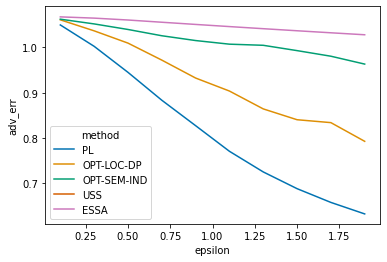

In [46]:
sns.lineplot(data=bj_x_vs_epsilon_df, x='epsilon', y='adv_err',hue='method')

<Axes: xlabel='epsilon', ylabel='adv_err'>

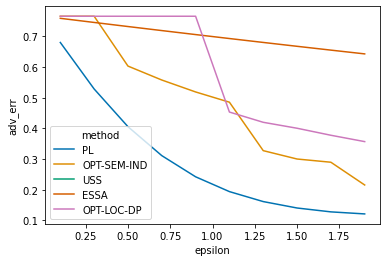

In [47]:
sns.lineplot(data=pd.read_csv('../result/BJ_x_vs_epsilon.csv'), x='epsilon', y='adv_err',hue='method')

## X vs dimension in BJ

- mean_ql
- kl_div
- max_div

In [40]:
RADIUS = 0.2

informative_user_df = pd.read_csv(f'../data/SHLOM_geolife_informative_SAMPING_{SUBSAMPLE_INTERVAL_MINUTE}_MIN_{MINIMUM_INFORMATIVE_SAMPLE_CNT}.csv')
informative_user_df['region'] = informative_user_df.region.astype(int)
poi_tree = bj_poi_tree
poi_df = bj_poi
grid = bj_grid
POI_ALL_BT = bj_poi.bt.unique()
POI_ALL_ST = bj_poi.st.unique()

def count_nearby_poi(coords, radius, type_tag):
    poi_ids = poi_tree.query_ball_point(coords, r=radius)
    nearby_df = poi_df.iloc[poi_ids]
    nearby_hist_series = nearby_df.groupby(type_tag).count().lat
    poi_hist = pd.Series(index=POI_ALL_BT if type_tag == 'bt' else POI_ALL_ST , data=0)
    poi_hist[nearby_hist_series.index] = nearby_hist_series
    return poi_hist

regions_offsets = []
for x in range(len(grid)):
    regions_offsets.append(grid.offset(grid.locate(x)))
mu = pd.DataFrame(data=regions_offsets, columns=['x', 'y'])
mu[POI_ALL_BT] = mu.parallel_apply(lambda df: count_nearby_poi(df[['x', 'y']], RADIUS, 'bt'), axis=1)
mu[POI_ALL_BT] = mu[POI_ALL_BT].astype(int)
mu = mu[POI_ALL_BT]

X = mu.index
Y = pd.Series(index=POI_ALL_BT, dtype=object)
for bt in POI_ALL_BT:
    Y[bt] = mu[bt].unique()
ic(X.size)

mu_ix = pd.Series(index=POI_ALL_BT, dtype=object)
for bt in POI_ALL_BT:
    mu_ix[bt] = pd.Series(index=Y[bt], dtype=object)
    for y in Y[bt]:
        mu_ix[bt][y] = mu[mu[bt]==y].index

a = np.tile(X, (X.size, 1))
b = np.tile(np.reshape(X, (X.size, 1)), (1, X.size))
x_a, y_a = a % grid.width_bins * grid.width_resolution, a // grid.width_bins * grid.height_resolution
x_b, y_b = b % grid.width_bins * grid.width_resolution, b // grid.width_bins * grid.height_resolution
d_mat = np.sqrt(np.square(x_a - x_b) + np.square(y_a - y_b))

ic| X.size: 575


In [41]:
uid_list = informative_user_df.uid.unique()
EPSILON = 0.7
spanner_stretch = 1.2

semantic_cats = np.arange(1, 6) #5

results = []
            
with tqdm(total=uid_list.size * semantic_cats.size) as pbar:
    
    for cat_cnt in semantic_cats:
    
        cats = POI_ALL_BT[:cat_cnt]
        has_geoind = pd.Series(index=uid_list, data=0)
    
        for uid in uid_list:
            f = None
            exp_ql = 0
            pi = np.zeros(X.size)
            df_u = informative_user_df.query('uid == @uid')
            visited_regions = df_u['region'].astype(int)
            hist = visited_regions.value_counts(normalize=True)
            pi[hist.index] = hist
            
            if has_geoind[uid] == 0:
                # PL
                pbar.set_description(f'PL, uid: {uid}, dim: {cat_cnt}')
                f = pl_f(X, EPSILON, d_mat)
                mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, cats)
                results.append((uid, 'PL', cat_cnt, mean_ql))
                # end of PL

                # OPT-GEO-IND
                pbar.set_description(f'OPT-LOC-DP, uid: {uid}, dim: {cat_cnt}')
                if os.path.exists(f'../data/opt-loc-dp_{X.size}_{uid}_{EPSILON}_{spanner_stretch}.npy'):
                    f = np.load(f'../data/opt-loc-dp_{X.size}_{uid}_{EPSILON}_{spanner_stretch}.npy')
                else:
                    exp_ql, f = opt_loc_dp(X, pi, d_mat, EPSILON)
                    np.save(f'../data/opt-loc-dp_{X.size}_{uid}_{EPSILON}_{spanner_stretch}.npy', f)
                mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, cats)
                results.append((uid, 'OPT-LOC-DP', cat_cnt, mean_ql))
                # end of OPT-GEO-IND
                
                has_geoind[uid] = 1
            
            # OPT-SEM-IND
            pbar.set_description(f'OPT-SEM-IND, uid: {uid}, dim: {cat_cnt}')
            if os.path.exists(f'../data/opt-sem-ind_{X.size}_{uid}_{EPSILON}_dim_{cat_cnt}.npy'):
                f = np.load(f'../data/opt-sem-ind_{X.size}_{uid}_{EPSILON}_dim_{cat_cnt}.npy')
            else:
                exp_ql, f = opt_sem_ind(X, Y, pi, mu_ix, d_mat, EPSILON, cats)
                np.save(f'../data/opt-sem-ind_{X.size}_{uid}_{EPSILON}_dim_{cat_cnt}.npy', f)
            mean_ql, kl_div, max_div, adv_err =  metric(X, df_u, pi, mu, mu_ix, f, d_mat, cats)
            results.append((uid, 'OPT-SEM-IND', cat_cnt, mean_ql))
            # end of OPT-SEM-IND
            
            # USS
            pbar.set_description(f'USS, uid: {uid}, dim: {cat_cnt}')
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, None, d_mat, cats, lambda p, size: uss(X, Y, p, mu, rng, size, cats))
            results.append((uid, 'USS', cat_cnt, mean_ql))
            # end of USS
            
            # ESSA
            pbar.set_description(f'ESSA, uid: {uid}, dim: {cat_cnt}')
            f = essa_f_md(X, Y, mu_ix, d_mat, EPSILON, cats)
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, cats)
            results.append((uid, 'ESSA', cat_cnt, mean_ql))
            # end of ESSA
            
            gc.collect()
            
            pbar.update(1)
            
        
bj_x_vs_epsilon_df = pd.DataFrame(columns=['uid', 'method', 'ndim', 'mean_ql'], data=results)
bj_x_vs_epsilon_df.to_csv('../result/BJ_x_vs_dims.csv')
bj_x_vs_epsilon_df

  0%|          | 0/50 [00:00<?, ?it/s]

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

## X vs dimension in NY

In [54]:
RADIUS = 0.2

poi_tree = ny_poi_tree
poi_df = ny_poi
grid = ny_grid
informative_user_df = pd.read_csv(f'../data/SHLOM_gowalla_informative_MIN_{MINIMUM_INFORMATIVE_SAMPLE_CNT}.csv')
informative_user_df['region'] = informative_user_df.region.astype(int)
POI_ALL_ST = ny_poi.st.unique()

def count_nearby_poi(coords, radius, type_tag):
    poi_ids = poi_tree.query_ball_point(coords, r=radius)
    nearby_df = poi_df.iloc[poi_ids]
    nearby_hist_series = nearby_df.groupby(type_tag).count().lat
    poi_hist = pd.Series(index=POI_ALL_BT if type_tag == 'bt' else POI_ALL_ST , data=0)
    poi_hist[nearby_hist_series.index] = nearby_hist_series
    return poi_hist

regions_offsets = []
for x in range(len(grid)):
    regions_offsets.append(grid.offset(grid.locate(x)))
mu = pd.DataFrame(data=regions_offsets, columns=['x', 'y'])
mu[POI_ALL_ST] = mu.parallel_apply(lambda df: count_nearby_poi(df[['x', 'y']], RADIUS, 'st'), axis=1)
mu[POI_ALL_ST] = mu[POI_ALL_ST].astype(int)
mu = mu[POI_ALL_ST]

X = mu.index
Y = pd.Series(index=POI_ALL_ST, dtype=object)
for bt in POI_ALL_ST:
    Y[bt] = mu[bt].unique()
ic(X.size)

mu_ix = pd.Series(index=POI_ALL_ST, dtype=object)
for bt in POI_ALL_ST:
    mu_ix[bt] = pd.Series(index=Y[bt], dtype=object)
    for y in Y[bt]:
        mu_ix[bt][y] = mu[mu[bt]==y].index

a = np.tile(X, (X.size, 1))
b = np.tile(np.reshape(X, (X.size, 1)), (1, X.size))
x_a, y_a = a % grid.width_bins * grid.width_resolution, a // grid.width_bins * grid.height_resolution
x_b, y_b = b % grid.width_bins * grid.width_resolution, b // grid.width_bins * grid.height_resolution
d_mat = np.sqrt(np.square(x_a - x_b) + np.square(y_a - y_b))

ic| X.size: 264


In [ ]:
uid_list = informative_user_df.uid.unique()
EPSILON = 0.7
spanner_stretch = 1.2

semantic_cats = np.arange(1, 6) #5

results = []
            
with tqdm(total=uid_list.size * semantic_cats.size) as pbar:
    
    for cat_cnt in semantic_cats:
    
        cats = POI_ALL_ST[:cat_cnt]
        has_geoind = pd.Series(index=uid_list, data=0)
    
        for uid in uid_list:
            f = None
            exp_ql = 0
            pi = np.zeros(X.size)
            df_u = informative_user_df.query('uid == @uid')
            visited_regions = df_u['region'].astype(int)
            hist = visited_regions.value_counts(normalize=True)
            pi[hist.index] = hist
            
            if has_geoind[uid] == 0:
                # PL
                pbar.set_description(f'PL, uid: {uid}, dim: {cat_cnt}')
                f = pl_f(X, EPSILON, d_mat)
                mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, cats)
                results.append((uid, 'PL', cat_cnt, mean_ql))
                # end of PL

                # OPT-GEO-IND
                pbar.set_description(f'OPT-LOC-DP, uid: {uid}, dim: {cat_cnt}')
                if os.path.exists(f'../data/opt-loc-dp_{X.size}_{uid}_{EPSILON}_{spanner_stretch}.npy'):
                    f = np.load(f'../data/opt-loc-dp_{X.size}_{uid}_{EPSILON}_{spanner_stretch}.npy')
                else:
                    exp_ql, f = opt_loc_dp(X, pi, d_mat, EPSILON)
                    np.save(f'../data/opt-loc-dp_{X.size}_{uid}_{EPSILON}_{spanner_stretch}.npy', f)
                mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, cats)
                results.append((uid, 'OPT-LOC-DP', cat_cnt, mean_ql))
                # end of OPT-GEO-IND
                
                has_geoind[uid] = 1
            
            # OPT-SEM-IND
            pbar.set_description(f'OPT-SEM-IND, uid: {uid}, dim: {cat_cnt}')
            if os.path.exists(f'../data/opt-sem-ind_{X.size}_{uid}_{EPSILON}_dim_{cat_cnt}.npy'):
                f = np.load(f'../data/opt-sem-ind_{X.size}_{uid}_{EPSILON}_dim_{cat_cnt}.npy')
            else:
                exp_ql, f = opt_sem_ind(X, Y, pi, mu_ix, d_mat, EPSILON, cats)
                np.save(f'../data/opt-sem-ind_{X.size}_{uid}_{EPSILON}_dim_{cat_cnt}.npy', f)
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, cats)
            results.append((uid, 'OPT-SEM-IND', cat_cnt, mean_ql))
            # end of OPT-SEM-IND
            
            # USS
            pbar.set_description(f'USS, uid: {uid}, dim: {cat_cnt}')
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, None, d_mat, cats, lambda p, size: uss(X, Y, p, mu, rng, size, cats))
            results.append((uid, 'USS', cat_cnt, mean_ql))
            # end of USS
            
            # ESSA
            pbar.set_description(f'ESSA, uid: {uid}, dim: {cat_cnt}')
            f = essa_f_md(X, Y, mu_ix, d_mat, EPSILON, cats)
            mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, cats)
            results.append((uid, 'ESSA', cat_cnt, mean_ql))
            # end of ESS
            
            gc.collect()
            
            pbar.update(1)
            
        
pri_x_vs_epsilon_df = pd.DataFrame(columns=['uid', 'method', 'ndim', 'mean_ql'], data=results)
pri_x_vs_epsilon_df.to_csv('../result/NY_x_vs_dims.csv')
pri_x_vs_epsilon_df

  0%|          | 0/100 [00:00<?, ?it/s]

## RT vs X in BJ

In [62]:
import time

RADIUS = 0.2

poi_tree = bj_poi_tree
poi_df = bj_poi
grid = bj_grid
POI_ALL_BT = bj_poi.bt.unique()
POI_ALL_ST = bj_poi.st.unique()
EPSILON = 0.7
SAMPLE_TIME = 1000

def count_nearby_poi(coords, radius, type_tag):
    poi_ids = poi_tree.query_ball_point(coords, r=radius)
    nearby_df = poi_df.iloc[poi_ids]
    nearby_hist_series = nearby_df.groupby(type_tag).count().lat
    poi_hist = pd.Series(index=POI_ALL_BT if type_tag == 'bt' else POI_ALL_ST , data=0)
    poi_hist[nearby_hist_series.index] = nearby_hist_series
    return poi_hist

X_LIST = np.arange(100, 570, 100)

results = []
with tqdm(total=X_LIST.size) as pbar:
    for x_size in X_LIST:
        ic(x_size)
        df = pd.read_csv(f'../data/SHLOM_geolife_informative_SAMPING_{SUBSAMPLE_INTERVAL_MINUTE}_MIN_{MINIMUM_INFORMATIVE_SAMPLE_CNT}.csv')
        resolution = 0.2 / np.sqrt(x_size / len(bj_grid))
        grid = Grid([39.987099, 116.295261], [39.945003,116.353967], resolution, resolution)
        r_x_y_df = df.parallel_apply(lambda df: pandarallel_assign(grid, df), axis=1)
        df.loc[:, ['region', 'x', 'y']] = r_x_y_df
        df['region'] = df['region'].astype(int)

        regions_offsets = []
        for x in range(len(grid)):
            regions_offsets.append(grid.offset(grid.locate(x)))
        mu = pd.DataFrame(data=regions_offsets, columns=['x', 'y'])
        mu[POI_ALL_BT] = mu.parallel_apply(lambda df: count_nearby_poi(df[['x', 'y']], RADIUS, 'bt'), axis=1)
        mu[POI_ALL_BT] = mu[POI_ALL_BT].astype(int)
        mu = mu[POI_ALL_BT]

        X = mu.index
        Y = pd.Series(index=POI_ALL_BT, dtype=object)
        for bt in POI_ALL_BT:
            Y[bt] = mu[bt].unique()
        ic(X.size)

        mu_ix = pd.Series(index=POI_ALL_BT, dtype=object)
        for bt in POI_ALL_BT:
            mu_ix[bt] = pd.Series(index=Y[bt], dtype=object)
            for y in Y[bt]:
                mu_ix[bt][y] = mu[mu[bt]==y].index

        a = np.tile(X, (X.size, 1))
        b = np.tile(np.reshape(X, (X.size, 1)), (1, X.size))
        x_a, y_a = a % grid.width_bins * grid.width_resolution, a // grid.width_bins * grid.height_resolution
        x_b, y_b = b % grid.width_bins * grid.width_resolution, b // grid.width_bins * grid.height_resolution
        d_mat = np.sqrt(np.square(x_a - x_b) + np.square(y_a - y_b))

        uid_list = df.uid.unique()
        spanner_stretch = 1.2
        
        ic('Testing...')

        for uid in uid_list:
            f = None
            exp_ql = 0
            pi = np.zeros(X.size)
            df_u = df.query('uid == @uid')
            visited_regions = df_u['region'].astype(int)
            hist = visited_regions.value_counts(normalize=True)
            pi[hist.index] = hist

            # PL
            pbar.set_description(f'PL, uid: {uid}, X: {X.size}')
            st = time.time()
            for _ in range(SAMPLE_TIME):
                k = pl_f(X, EPSILON, d_mat)
                # k = pl(X, int(df_u.sample().region), grid, EPSILON, rng, size=1)
            dt = time.time() - st
            results.append((uid, 'PL', x_size, dt))
            # end of PL

            # OPT-GEO-IND
            pbar.set_description(f'OPT-LOC-DP, uid: {uid}, X: {X.size}')
            st = time.time()
            exp_ql, f = opt_loc_dp(X, pi, d_mat, EPSILON)
            for _ in range(SAMPLE_TIME):
                p = rng.choice(X, 1, p=f[0])
            dt = time.time() - st
            results.append((uid, 'OPT-LOC-DP', x_size, dt))
            # end of OPT-GEO-IND

            # OPT-SEM-IND
            pbar.set_description(f'OPT-SEM-IND, uid: {uid}, X: {X.size}')
            st = time.time()
            exp_ql, f = opt_sem_ind(X, Y, pi, mu_ix, d_mat, EPSILON, [1])
            for _ in range(SAMPLE_TIME):
                p = rng.choice(X, 1, p=f[0])
            dt = time.time() - st
            results.append((uid, 'OPT-SEM-IND', x_size, dt))
            # end of OPT-SEM-IND

            # USS
            pbar.set_description(f'USS, uid: {uid}, X: {X.size}')
            st = time.time()
            for _ in range(SAMPLE_TIME):
                k = uss(X, Y, int(df_u.sample().region), mu, rng, 1, [1])
            dt = time.time() - st
            results.append((uid, 'USS', x_size, dt))
            # end of USS

            # ESSA
            pbar.set_description(f'ESSA, uid: {uid}, X: {X.size}')
            st = time.time()
            for _ in range(SAMPLE_TIME):
                k = essa_f(X, Y, mu_ix, d_mat, EPSILON, 1)
                # k = ess_f(X, Y, int(df_u.sample().region), mu, d_mat, rng, EPSILON, 1, 1)
            dt = time.time() - st
            results.append((uid, 'ESSA', x_size, dt))
            # end of ESSA
        pbar.update(1)

rt_vs_x_df = pd.DataFrame(columns=['uid', 'method', 'x_size', 't'], data=results)
rt_vs_x_df.to_csv('../result/BJ_rt_vs_x.csv')
rt_vs_x_df

  0%|          | 0/5 [00:00<?, ?it/s]

ic| x_size: 100
ic| X.size: 90
ic| 'Testing...'
ic| x_size: 200
ic| X.size: 182
ic| 'Testing...'
ic| x_size: 300
ic| X.size: 288
ic| 'Testing...'
ic| x_size: 400
ic| X.size: 380
ic| 'Testing...'
ic| x_size: 500
ic| X.size: 483
ic| 'Testing...'


,uid,method,x_size,t
0,4,PL,100,0.020209
1,4,OPT-LOC-DP,100,1.295743
2,4,OPT-SEM-IND,100,0.417216
3,4,USS,100,0.096699
4,4,ESSA,100,0.060165
5,4,PL,200,0.074363
6,4,OPT-LOC-DP,200,3.839069
7,4,OPT-SEM-IND,200,0.794024
8,4,USS,200,0.140619
9,4,ESSA,200,0.098854


## RT vs NDims in BJ

In [22]:
import time
RADIUS = 0.2

df = pd.read_csv(f'../data/SHLOM_geolife_informative_SAMPING_{SUBSAMPLE_INTERVAL_MINUTE}_MIN_{MINIMUM_INFORMATIVE_SAMPLE_CNT}.csv')
df['region'] = df.region.astype(int)
poi_tree = bj_poi_tree
poi_df = bj_poi
grid = bj_grid
POI_ALL_BT = bj_poi.bt.unique()
POI_ALL_ST = bj_poi.st.unique()
EPSILON = 0.7
SAMPLE_TIME = 1000

def count_nearby_poi(coords, radius, type_tag):
    poi_ids = poi_tree.query_ball_point(coords, r=radius)
    nearby_df = poi_df.iloc[poi_ids]
    nearby_hist_series = nearby_df.groupby(type_tag).count().lat
    poi_hist = pd.Series(index=POI_ALL_BT if type_tag == 'bt' else POI_ALL_ST , data=0)
    poi_hist[nearby_hist_series.index] = nearby_hist_series
    return poi_hist

N_DIMS = np.arange(1, 10, 2)
regions_offsets = []
for x in range(len(grid)):
    regions_offsets.append(grid.offset(grid.locate(x)))

results = []
with tqdm(total=N_DIMS.size) as pbar:
    for ndim in N_DIMS:
        cats = POI_ALL_BT[:ndim]
        
        mu = pd.DataFrame(data=regions_offsets, columns=['x', 'y'])
        mu[POI_ALL_BT] = mu.parallel_apply(lambda df: count_nearby_poi(df[['x', 'y']], RADIUS, 'bt'), axis=1)
        mu[POI_ALL_BT] = mu[POI_ALL_BT].astype(int)
        mu = mu[POI_ALL_BT]

        X = mu.index
        Y = pd.Series(index=POI_ALL_BT, dtype=object)
        for bt in POI_ALL_BT:
            Y[bt] = mu[bt].unique()
        ic(X.size)

        mu_ix = pd.Series(index=POI_ALL_BT, dtype=object)
        for bt in POI_ALL_BT:
            mu_ix[bt] = pd.Series(index=Y[bt], dtype=object)
            for y in Y[bt]:
                mu_ix[bt][y] = mu[mu[bt]==y].index

        a = np.tile(X, (X.size, 1))
        b = np.tile(np.reshape(X, (X.size, 1)), (1, X.size))
        x_a, y_a = a % grid.width_bins * grid.width_resolution, a // grid.width_bins * grid.height_resolution
        x_b, y_b = b % grid.width_bins * grid.width_resolution, b // grid.width_bins * grid.height_resolution
        d_mat = np.sqrt(np.square(x_a - x_b) + np.square(y_a - y_b))

        uid_list = df.uid.unique()
        spanner_stretch = 1.2
        
        ic('Testing...')

        for uid in uid_list:
            f = None
            exp_ql = 0
            pi = np.zeros(X.size)
            df_u = df.query('uid == @uid')
            visited_regions = df_u['region'].astype(int)
            hist = visited_regions.value_counts(normalize=True)
            pi[hist.index] = hist

            # PL
            pbar.set_description(f'PL, uid: {uid}, X: {X.size}')
            st = time.time()
            for _ in range(SAMPLE_TIME):
                k = pl_f(X, EPSILON, d_mat)
            dt = time.time() - st
            results.append((uid, 'PL', ndim, dt))
            # end of PL

            # OPT-GEO-IND
            pbar.set_description(f'OPT-GEO-IND, uid: {uid}, X: {X.size}')
            st = time.time()
            exp_ql, f = opt_loc_dp(X, pi, d_mat, EPSILON)
            for _ in range(SAMPLE_TIME):
                p = rng.choice(X, 1, p=f[0])
            dt = time.time() - st
            results.append((uid, 'OPT-LOC-DP', ndim, dt))
            # end of OPT-GEO-IND

            # OPT-SEM-IND
            pbar.set_description(f'OPT-SEM-IND, uid: {uid}, X: {X.size}')
            st = time.time()
            exp_ql, f = opt_sem_ind(X, Y, pi, mu_ix, d_mat, EPSILON, cats)
            for _ in range(SAMPLE_TIME):
                p = rng.choice(X, 1, p=f[0])
            dt = time.time() - st
            results.append((uid, 'OPT-SEM-IND', ndim, dt))
            # end of OPT-SEM-IND

            # USS
            pbar.set_description(f'USS, uid: {uid}, X: {X.size}')
            st = time.time()
            for _ in range(SAMPLE_TIME):
                k = uss(X, Y, int(df_u.sample().region), mu, rng, 1, cats)
            dt = time.time() - st
            results.append((uid, 'USS', ndim, dt))
            # end of USS

            # ESS
            pbar.set_description(f'ESSA, uid: {uid}, X: {X.size}')
            st = time.time()
            for _ in range(SAMPLE_TIME):
                k = essa_md(X, Y, int(df_u.sample().region), mu_ix, d_mat, EPSILON, cats)
            dt = time.time() - st
            results.append((uid, 'ESSA', ndim, dt))
            # end of ESS
        pbar.update(1)

rt_vs_x_df = pd.DataFrame(columns=['uid', 'method', 'ndim', 't'], data=results)
rt_vs_x_df.to_csv('../result/BJ_rt_vs_ndims.csv')
rt_vs_x_df

  0%|          | 0/5 [00:00<?, ?it/s]

ic| X.size: 575
ic| 'Testing...'
ic| X.size: 575
ic| 'Testing...'
ic| X.size: 575
ic| 'Testing...'
ic| X.size: 575
ic| 'Testing...'
ic| X.size: 575
ic| 'Testing...'


,uid,method,ndim,t
0,4,PL,1,5.264539
1,4,OPT-LOC-DP,1,26.196961
2,4,OPT-SEM-IND,1,7.167449
3,4,USS,1,2.011169
4,4,ESSA,1,1.595742
5,4,PL,3,5.210249
6,4,OPT-LOC-DP,3,25.917576
7,4,OPT-SEM-IND,3,24.016866
8,4,USS,3,8.432609
9,4,ESSA,3,3.846786


## PoI dist in BJ

In [31]:
poi_df = bj_poi
grid = bj_grid
poi_tree = bj_poi_tree
POI_ALL_BT = poi_df.bt.unique()
POI_ALL_ST = poi_df.st.unique()
ic(poi_df.groupby('bt').count().lat)
RADIUS = 0.2

def count_nearby_poi(coords, radius, type_tag):
    poi_ids = poi_tree.query_ball_point(coords, r=radius)
    nearby_df = poi_df.iloc[poi_ids]
    nearby_hist_series = nearby_df.groupby(type_tag).count().lat
    poi_hist = pd.Series(index=POI_ALL_BT if type_tag == 'bt' else POI_ALL_ST , data=0)
    poi_hist[nearby_hist_series.index] = nearby_hist_series
    return poi_hist

regions_offsets = []
for x in range(len(grid)):
    regions_offsets.append(grid.offset(grid.locate(x)))
mu = pd.DataFrame(data=regions_offsets, columns=['x', 'y'])
mu[POI_ALL_BT] = mu.parallel_apply(lambda df: count_nearby_poi(df[['x', 'y']], RADIUS, 'bt'), axis=1)
mu[POI_ALL_BT] = mu[POI_ALL_BT].astype(int)
mu = mu[POI_ALL_BT]
bj_mu = mu

ic| poi_df.groupby('bt').count().lat: bt
                                      0     1358
                                      1      453
                                      2     1547
                                      3       46
                                      4        1
                                      5     1313
                                      6      153
                                      7     4140
                                      8      682
                                      9      277
                                      10    1550
                                      11     325
                                      12     605
                                      13      12
                                      14    1358
                                      15    1604
                                      16      41
                                      17     304
                                      18      38
                            

In [36]:
c = 1
# generate large color map
opacity = pd.Series(index=np.sort(mu[c].unique()), data=np.arange(0, 1, 1 / mu[c].nunique())[:mu[c].nunique()])

# mu 越小，图中越透明
# mmap = grid.map(tiles='https://{s}.basemaps.cartocdn.com/rastertiles/positron/{z}/{x}/{y}{r}.png', attr='Carto')
mmap = grid.map(tiles='http://webrd02.is.autonavi.com/appmaptile?lang=en&size=1&scale=1&style=8&x={x}&y={y}&z={z}', location=grid.locate(0), attr='default')
# mmap = grid.map(tiles='https://mt.google.com/vt/lyrs=h&x={x}&y={y}&z={z}', location=grid.locate(0), attr='Carto')
# mmap = grid.map()


for i in range(len(grid)):
    style_ = {
                'fillColor': '#4c72b0',
                'color': '#4c72b0',
                'weight': 0.5,
                'fillOpacity': opacity[mu[c][i]],
                'opacity': opacity[mu[c][i]]
            }
    folium.GeoJson({
            "type": "Feature",
            "geometry": {
                "type": "Polygon",
                "coordinates": [
                    grid.closed_polygon(i)
                ]
            }
        }, name=str(
        i), style_function=lambda f, sty=style_: sty).add_to(mmap)
    
# folium.TileLayer('cartodbpositron').add_to(mmap)
# folium.TileLayer('cartodbpositron').add_to(mmap)
mmap.save('../graph/m.html')
mmap

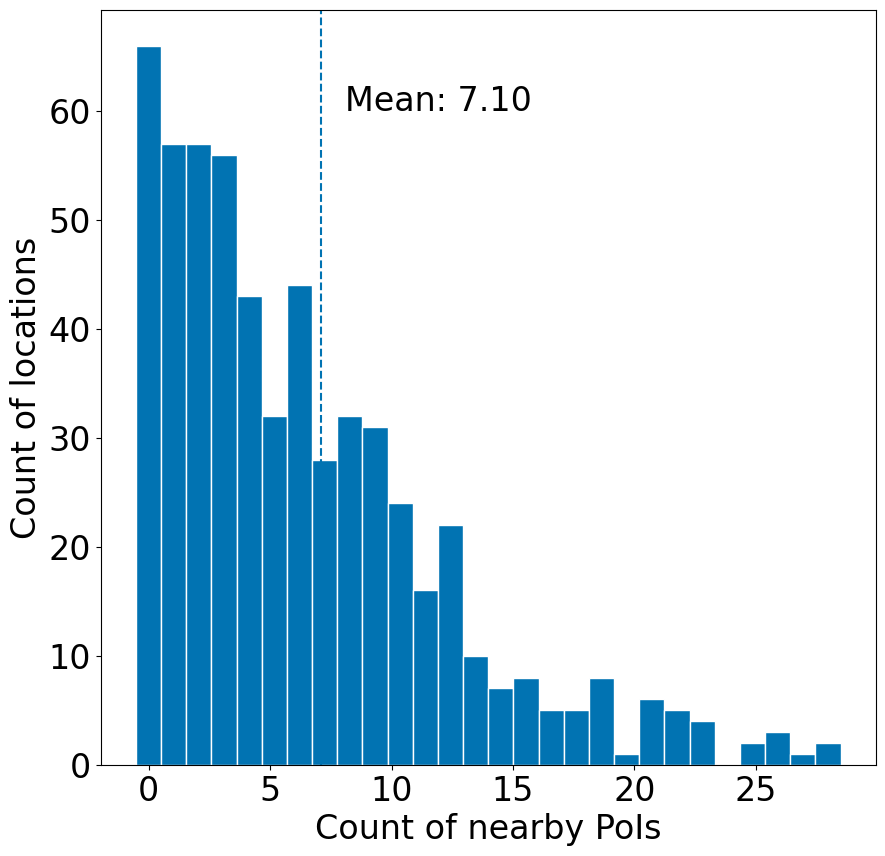

In [37]:
fig = plt.figure(figsize=(10, 10), dpi=100)
plt.hist(mu[0], bins=mu[0].nunique(), edgecolor = 'white', align='left')
plt.axvline(x=mu[0].mean(), linestyle='--')
plt.text(mu[0].mean() + 1, 60, 'Mean: {:.2f}'.format(mu[0].mean()), fontsize=24)
plt.xticks(np.arange(0, mu[0].nunique(),5), fontsize=24)
plt.yticks(fontsize=24)
plt.xlabel('Count of nearby PoIs', fontsize=24)
plt.ylabel('Count of locations', fontsize=24)
plt.savefig('../graph/bj_poi_hist_0.jpg', dpi=100)
plt.savefig('../graph/bj_poi_hist_0.pdf', dpi=100)
fig.show()

## PoI dist in NY

In [32]:
poi_df = ny_poi
grid = ny_grid
poi_tree = ny_poi_tree
POI_ALL_ST = poi_df.st.unique()
ic(poi_df.groupby('st').count().lat)
RADIUS = 0.2

def count_nearby_poi(coords, radius, type_tag):
    poi_ids = poi_tree.query_ball_point(coords, r=radius)
    nearby_df = poi_df.iloc[poi_ids]
    nearby_hist_series = nearby_df.groupby(type_tag).count().lat
    poi_hist = pd.Series(index=POI_ALL_BT if type_tag == 'bt' else POI_ALL_ST , data=0)
    poi_hist[nearby_hist_series.index] = nearby_hist_series
    return poi_hist

regions_offsets = []
for x in range(len(grid)):
    regions_offsets.append(grid.offset(grid.locate(x)))
mu = pd.DataFrame(data=regions_offsets, columns=['x', 'y'])
mu[POI_ALL_ST] = mu.parallel_apply(lambda df: count_nearby_poi(df[['x', 'y']], RADIUS, 'st'), axis=1)
mu[POI_ALL_ST] = mu[POI_ALL_ST].astype(int)
mu = mu[POI_ALL_ST]
ny_mu = mu

ic| poi_df.groupby('st').count().lat: st
                                      0     1503
                                      1       43
                                      2      373
                                      3       20
                                      4      435
                                            ... 
                                      90       1
                                      91       1
                                      92       2
                                      93       1
                                      94       1
                                      Name: lat, Length: 95, dtype: int64


In [39]:
c = 2
ic(mu[c].nunique())
# generate large color map
opacity = pd.Series(index=np.sort(mu[c].unique()), data=np.arange(0, 1, 1 / mu[c].nunique())[:mu[c].nunique()])

# mu 越小，图中越透明
# mmap = grid.map(tiles='http://webrd02.is.autonavi.com/appmaptile?lang=en&size=1&scale=1&style=8&x={x}&y={y}&z={z}', location=grid.locate(0), attr='default')
# mmap = grid.map(tiles='https://{s}.basemaps.cartocdn.com/rastertiles/voyager/{z}/{x}/{y}{r}.png', attr='Carto')
mmap = grid.map(tiles='https://mt.google.com/vt/lyrs=r&x={x}&y={y}&z={z}', location=grid.locate(0), attr='Carto')

for i in range(len(grid)):
    style_ = {
                'fillColor': '#4c72b0',
                'color': '#4c72b0',
                'weight': 0.5,
                'fillOpacity': opacity[mu[c][i]],
                'opacity': opacity[mu[c][i]]
            }
    folium.GeoJson({
            "type": "Feature",
            "geometry": {
                "type": "Polygon",
                "coordinates": [
                    grid.closed_polygon(i)
                ]
            }
        }, name=str(
        i), style_function=lambda f, sty=style_: sty).add_to(mmap)
    
mmap

ic| mu[c].nunique(): 15


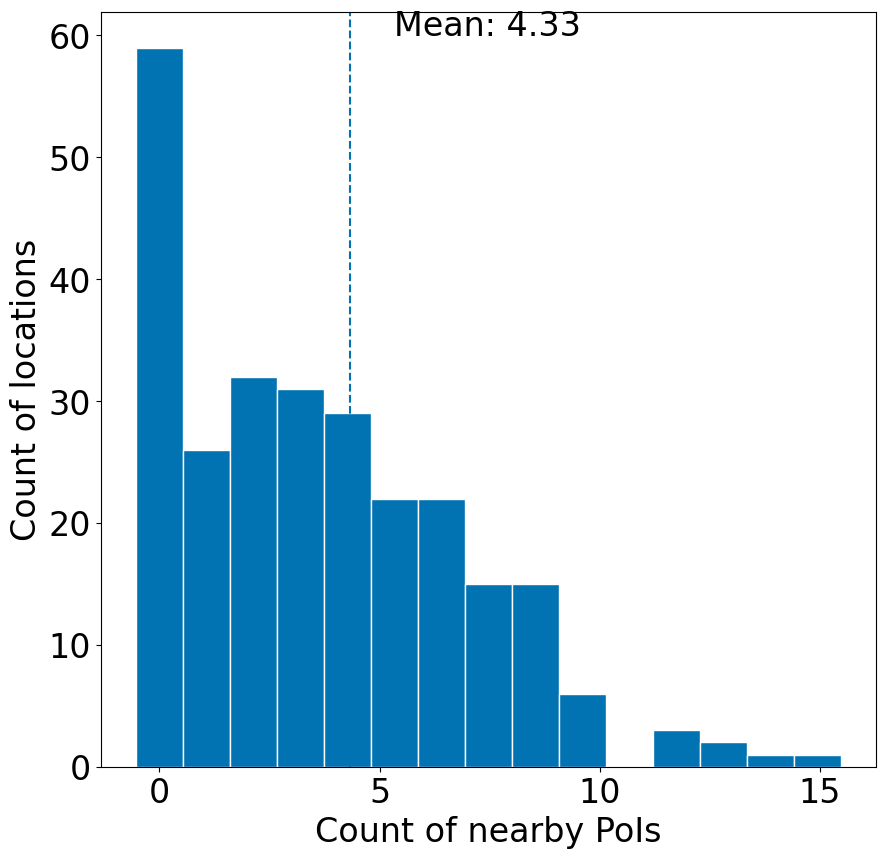

In [40]:
plt.rcParams['font.size']=24
fig = plt.figure(figsize=(10, 10), dpi=100)
plt.hist(mu[c], bins=mu[c].nunique(), edgecolor = 'white', align='left')
plt.axvline(x=mu[2].mean(), linestyle='--')
plt.text(mu[c].mean() + 1, 60, 'Mean: {:.2f}'.format(mu[c].mean()), fontsize=24)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.xlabel('Count of nearby PoIs', fontsize=24)
plt.ylabel('Count of locations', fontsize=24)
fig.savefig('../graph/pri_poi_hist_3.jpg', dpi=100)
fig.savefig('../graph/pri_poi_hist_3.pdf', dpi=100)
plt.show()

### BJ

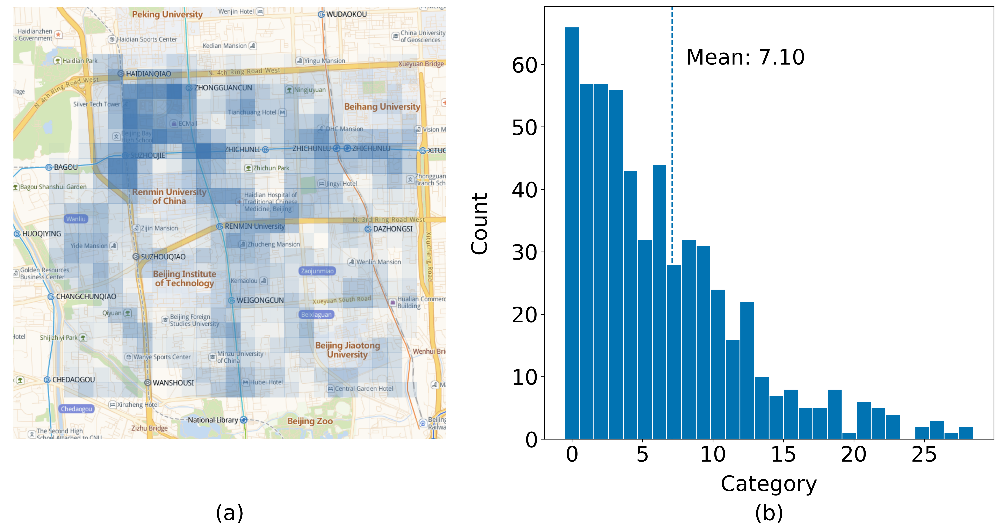

In [44]:
from PIL import Image
import matplotlib

plt.rcParams['axes.facecolor']='white'
plt.rcParams['axes.edgecolor']='black'
plt.rcParams['savefig.facecolor']='white'
plt.rcParams['savefig.edgecolor']='black'
plt.rcParams['font.size']=24

fig, axs = plt.subplots(1, 2, figsize=(20, 9), dpi=300)

axs[0].imshow(Image.open('../graph/bj_poi_0.png'))
axs[0].grid(False)
axs[0].set_xticks([0])
axs[0].tick_params(axis='x', colors='white')
axs[0].set_yticks([])

for child in axs[0].get_children():
    if isinstance(child, matplotlib.spines.Spine):
        child.set_color('white')

axs[1].hist(bj_mu[0], bins=bj_mu[0].nunique(), edgecolor = 'white', align='left')
axs[1].axvline(x=bj_mu[0].mean(), linestyle='--')
axs[1].text(x=bj_mu[0].mean() + 1, y=60, s='Mean: {:.2f}'.format(bj_mu[0].mean()), fontsize=24)
axs[1].set_xticks(np.arange(0, bj_mu[0].nunique(),5))
axs[1].text(x=.5, y=-.12, s='Category', fontsize=24, transform=axs[1].transAxes, ha='center')
axs[1].set_ylabel('Count')
axs[1].yaxis.set_label_coords(-.12, .5)

axs[0].set_xlabel(f'(a)')
axs[1].set_xlabel(f'(b)')
axs[0].xaxis.set_label_coords(.5, -0.15)
axs[1].xaxis.set_label_coords(.5, -0.15)

fig.savefig("../graph/bj_sem.eps", bbox_inches="tight", dpi=300)
fig.savefig("../graph/bj_sem.pdf", bbox_inches="tight", dpi=300)

### NY

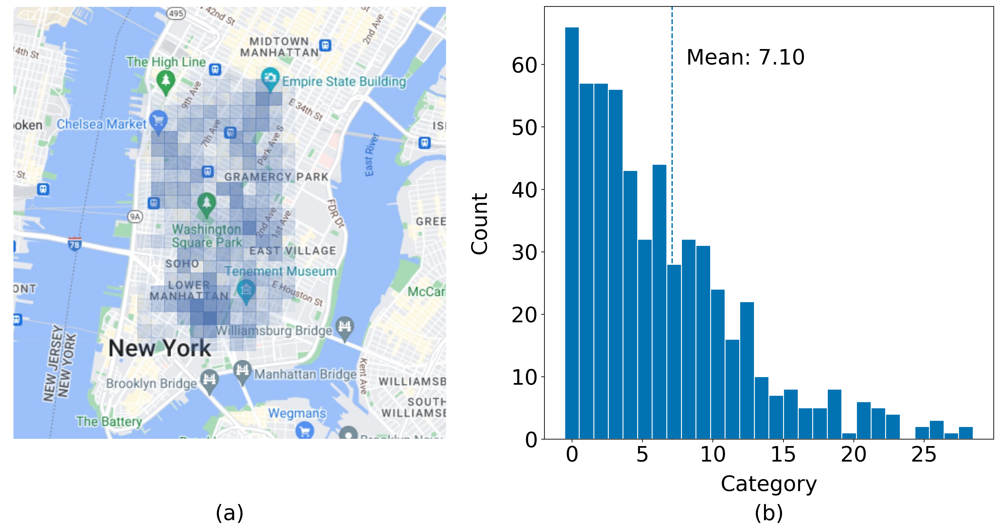

In [43]:
from PIL import Image
import matplotlib

plt.rcParams['axes.facecolor']='white'
plt.rcParams['axes.edgecolor']='black'
plt.rcParams['savefig.facecolor']='white'
plt.rcParams['savefig.edgecolor']='black'
plt.rcParams['font.size']=24

fig, axs = plt.subplots(1, 2, figsize=(20, 9), dpi=300)

axs[0].imshow(Image.open('../graph/pri_poi_2.jpg'))
axs[0].grid(False)
axs[0].set_xticks([0])
axs[0].set_yticks([])
axs[0].tick_params(axis='x', colors='white')

for child in axs[0].get_children():
    if isinstance(child, matplotlib.spines.Spine):
        child.set_color('white')

axs[1].hist(bj_mu[0], bins=bj_mu[0].nunique(), edgecolor = 'white', align='left')
axs[1].axvline(x=bj_mu[0].mean(), linestyle='--')
axs[1].text(x=bj_mu[0].mean() + 1, y=60, s='Mean: {:.2f}'.format(bj_mu[0].mean()), fontsize=24)
axs[1].set_xticks(np.arange(0, bj_mu[0].nunique(),5))
axs[1].text(x=.5, y=-.12, s='Category', fontsize=24, transform=axs[1].transAxes, ha='center')
axs[1].set_ylabel('Count')
axs[1].yaxis.set_label_coords(-.12, .5)

axs[0].set_xlabel(f'(a)')
axs[1].set_xlabel(f'(b)')
axs[0].xaxis.set_label_coords(.5, -0.15)
axs[1].xaxis.set_label_coords(.5, -0.15)
    
fig.savefig("../graph/pri_sem.jpg", bbox_inches="tight", dpi=300)
fig.savefig("../graph/pri_sem.pdf", bbox_inches="tight", dpi=300)

## QL vs |Y| in 1d in BJ

In [89]:
RADIUS = 0.2

informative_user_df = pd.read_csv(f'../data/SHLOM_geolife_informative_SAMPING_{SUBSAMPLE_INTERVAL_MINUTE}_MIN_{MINIMUM_INFORMATIVE_SAMPLE_CNT}.csv')
informative_user_df['region'] = informative_user_df.region.astype(int)
poi_tree = bj_poi_tree
poi_df = bj_poi
grid = bj_grid
POI_ALL_BT = bj_poi.bt.unique()
POI_ALL_ST = bj_poi.st.unique()

def count_nearby_poi(coords, radius, type_tag):
    poi_ids = poi_tree.query_ball_point(coords, r=radius)
    nearby_df = poi_df.iloc[poi_ids]
    nearby_hist_series = nearby_df.groupby(type_tag).count().lat
    poi_hist = pd.Series(index=POI_ALL_BT if type_tag == 'bt' else POI_ALL_ST , data=0)
    poi_hist[nearby_hist_series.index] = nearby_hist_series
    return poi_hist

regions_offsets = []
for x in range(len(grid)):
    regions_offsets.append(grid.offset(grid.locate(x)))
mu = pd.DataFrame(data=regions_offsets, columns=['x', 'y'])
mu[POI_ALL_BT] = mu.parallel_apply(lambda df: count_nearby_poi(df[['x', 'y']], RADIUS, 'bt'), axis=1)
mu[POI_ALL_BT] = mu[POI_ALL_BT].astype(int)
mu = mu[POI_ALL_BT]

X = mu.index
Y = pd.Series(index=POI_ALL_BT, dtype=object)
for bt in POI_ALL_BT:
    Y[bt] = mu[bt].unique()
ic(X.size)

mu_ix = pd.Series(index=POI_ALL_BT, dtype=object)
for bt in POI_ALL_BT:
    mu_ix[bt] = pd.Series(index=Y[bt], dtype=object)
    for y in Y[bt]:
        mu_ix[bt][y] = mu[mu[bt]==y].index

a = np.tile(X, (X.size, 1))
b = np.tile(np.reshape(X, (X.size, 1)), (1, X.size))
x_a, y_a = a % grid.width_bins * grid.width_resolution, a // grid.width_bins * grid.height_resolution
x_b, y_b = b % grid.width_bins * grid.width_resolution, b // grid.width_bins * grid.height_resolution
d_mat = np.sqrt(np.square(x_a - x_b) + np.square(y_a - y_b))
ic(d_mat[0,-1])
    
cat_list = np.array([3, 12, 2])
ic('choosed:')
for bt in cat_list:
    ic(bt, bt_uniques[bt], mu[bt].nunique())

ic| X.size: 575
ic| d_mat[0,-1]: 6.511528238439883
ic| 'choosed:'
ic| bt: 3, bt_uniques[bt]: '汽车服务', mu[bt].nunique(): 5
ic| bt: 12, bt_uniques[bt]: '金融保险服务', mu[bt].nunique(): 25
ic| bt: 2, bt_uniques[bt]: '购物服务', mu[bt].nunique(): 52


In [ ]:
uid_list = informative_user_df.uid.unique()
epsilon_s_list = np.arange(0.2, 2, 0.4)
spanner_stretch = 1.2

results = []
            
with tqdm(total=cat_list.size * uid_list.size * epsilon_s_list.size) as pbar:
    
    for c in cat_list:
        
        has_uss = pd.Series(index=uid_list, data=0)
    
        for epsilon in epsilon_s_list:

            for uid in uid_list:
                f = None
                exp_ql = 0
                pi = np.zeros(X.size)
                df_u = informative_user_df.query('uid == @uid')
                visited_regions = df_u['region'].astype(int)
                hist = visited_regions.value_counts(normalize=True)
                pi[hist.index] = hist

                # OPT-SEM-IND
                pbar.set_description(f'OPT-SEM-IND, uid: {uid}, epsilon: {epsilon}, c:{c}')
                if os.path.exists(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_{c}.npy'):
                    f = np.load(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_{c}.npy')
                else:
                    exp_ql, f = opt_sem_ind(X, Y, pi, mu_ix, d_mat, epsilon, [c])
                    np.save(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_{c}.npy', f)
                mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [c])
                results.append((uid, 'OPT-SEM-IND', c, epsilon, mean_ql))
                # end of OPT-SEM-IND

                # USS
                if has_uss[uid] == 0:
                    pbar.set_description(f'USS, uid: {uid}, epsilon: {epsilon}, c:{c}')
                    f = uss_f(X, Y, mu, c)
                    mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [c])
                    results.append((uid, 'USS', c, epsilon, mean_ql))
                    has_uss[uid] = 1
                # end of USS

                # ESSA
                pbar.set_description(f'ESSA, uid: {uid}, epsilon: {epsilon}, c:{c}')
                f = essa_f(X, Y, mu_ix, d_mat, epsilon, c)
                mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [c])
                results.append((uid, 'ESSA', c, epsilon, mean_ql))
                # end of ESSA

                gc.collect()

                pbar.update(1)
            
        
bj_x_vs_epsilon_df = pd.DataFrame(columns=['uid', 'method', 'c', 'epsilon', 'meanql'], data=results)
bj_x_vs_epsilon_df.to_csv('../result/BJ_ql_vs_epsilon_c.csv')
bj_x_vs_epsilon_df

## QL vs |Y| in 1d in NY

In [25]:
RADIUS = 0.2

poi_tree = ny_poi_tree
poi_df = ny_poi
grid = ny_grid
informative_user_df = pd.read_csv(f'../data/SHLOM_gowalla_informative_MIN_{MINIMUM_INFORMATIVE_SAMPLE_CNT}.csv')
informative_user_df['region'] = informative_user_df.region.astype(int)
ic(informative_user_df.shape)
POI_ALL_ST = ny_poi.st.unique()

def count_nearby_poi(coords, radius, type_tag):
    poi_ids = poi_tree.query_ball_point(coords, r=radius)
    nearby_df = poi_df.iloc[poi_ids]
    nearby_hist_series = nearby_df.groupby(type_tag).count().lat
    poi_hist = pd.Series(index=POI_ALL_BT if type_tag == 'bt' else POI_ALL_ST , data=0)
    poi_hist[nearby_hist_series.index] = nearby_hist_series
    return poi_hist

regions_offsets = []
for x in range(len(grid)):
    regions_offsets.append(grid.offset(grid.locate(x)))
mu = pd.DataFrame(data=regions_offsets, columns=['x', 'y'])
mu[POI_ALL_ST] = mu.parallel_apply(lambda df: count_nearby_poi(df[['x', 'y']], RADIUS, 'st'), axis=1)
mu[POI_ALL_ST] = mu[POI_ALL_ST].astype(int)
mu = mu[POI_ALL_ST]

X = mu.index
Y = pd.Series(index=POI_ALL_ST, dtype=object)
for bt in POI_ALL_ST:
    Y[bt] = mu[bt].unique()
ic(X.size)

mu_ix = pd.Series(index=POI_ALL_ST, dtype=object)
for bt in POI_ALL_ST:
    mu_ix[bt] = pd.Series(index=Y[bt], dtype=object)
    for y in Y[bt]:
        mu_ix[bt][y] = mu[mu[bt]==y].index

a = np.tile(X, (X.size, 1))
b = np.tile(np.reshape(X, (X.size, 1)), (1, X.size))
x_a, y_a = a % grid.width_bins * grid.width_resolution, a // grid.width_bins * grid.height_resolution
x_b, y_b = b % grid.width_bins * grid.width_resolution, b // grid.width_bins * grid.height_resolution
d_mat = np.sqrt(np.square(x_a - x_b) + np.square(y_a - y_b))
ic(d_mat[0,-1])
     
cat_list = np.array([3, 15, 13])
ic('choosed:')
for bt in cat_list:
    ic(bt, st_uniques[bt], mu[bt].nunique())

ic| informative_user_df.shape: (16179, 9)
ic| X.size: 264
ic| d_mat[0,-1]: 4.741307836451879
ic| 'choosed:'
ic| bt: 3, st_uniques[bt]: '交通服务相关', mu[bt].nunique(): 5
ic| bt: 15, st_uniques[bt]: '服装鞋帽皮具店', mu[bt].nunique(): 19
ic| bt: 13, st_uniques[bt]: '综合市场', mu[bt].nunique(): 49


In [26]:
uid_list = informative_user_df.uid.unique()
epsilon_s_list = np.arange(0.2, 2, 0.4)
spanner_stretch = 1.2
D = d_mat[0, X.size-1]

results = []
            
with tqdm(total=cat_list.size * uid_list.size * epsilon_s_list.size) as pbar:
    
    for c in cat_list:
        
        has_uss = pd.Series(index=uid_list, data=0)
    
        for epsilon in epsilon_s_list:

            for uid in uid_list:
                f = None
                exp_ql = 0
                pi = np.zeros(X.size)
                df_u = informative_user_df.query('uid == @uid')
                visited_regions = df_u['region'].astype(int)
                hist = visited_regions.value_counts(normalize=True)
                pi[hist.index] = hist

                # OPT-SEM-IND
                pbar.set_description(f'OPT-SEM-IND, uid: {uid}, epsilon: {epsilon}, c:{c}')
                if os.path.exists(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_{c}.npy'):
                    f = np.load(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_{c}.npy')
                else:
                    exp_ql, f = opt_sem_ind(X, Y, pi, mu_ix, d_mat, epsilon, [c])
                    np.save(f'../data/opt-sem-ind_{X.size}_{uid}_{epsilon}_{c}.npy', f)
                mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [c])
                results.append((uid, 'OPT-SEM-IND', c, epsilon, mean_ql))
                # end of OPT-SEM-IND

                # USS
                if has_uss[uid] == 0:
                    pbar.set_description(f'USS, uid: {uid}, epsilon: {epsilon}, c:{c}')
                    f = uss_f(X, Y, mu, c)
                    mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [c])
                    results.append((uid, 'USS', c, epsilon, mean_ql))
                    has_uss[uid] = 1
                # end of USS

                # ESSA
                pbar.set_description(f'ESSA, uid: {uid}, epsilon: {epsilon}, c:{c}')
                f = essa_f(X, Y, mu_ix, d_mat, epsilon, c)
                mean_ql, kl_div, max_div, adv_err = metric(X, df_u, pi, mu, mu_ix, f, d_mat, [c])
                results.append((uid, 'ESSA', c, epsilon, mean_ql))
                # end of ESSA

                gc.collect()

                pbar.update(1)
            
        
bj_x_vs_epsilon_df = pd.DataFrame(columns=['uid', 'method', 'c', 'epsilon', 'meanql'], data=results)
bj_x_vs_epsilon_df.to_csv('../result/NY_ql_vs_epsilon_c.csv')
bj_x_vs_epsilon_df

  0%|          | 0/300 [00:00<?, ?it/s]

Set parameter Username
Academic license - for non-commercial use only - expires 2023-11-06


,uid,method,c,epsilon,meanql
0,22,OPT-SEM-IND,3,0.2,0.029380
1,22,USS,3,0.2,1.202462
2,22,ESSA,3,0.2,0.126582
3,590,OPT-SEM-IND,3,0.2,0.019108
4,590,USS,3,0.2,0.979261
...,...,...,...,...,...
655,104357,ESSA,13,1.8,0.684749
656,122586,OPT-SEM-IND,13,1.8,0.240307
657,122586,ESSA,13,1.8,0.660029
658,153607,OPT-SEM-IND,13,1.8,0.242287
